### **Capstone - Group 2 - CV 1 - Pneumonia Detection Project**

##### Group Members:
1.	Malcolm Nicholas Monserrate
2.	Minatchi S
3.	Navin Kumar Patro
4.	Shiva Chari
5.	Soumya Ranjan Behera
6.	Sunidhi Dixit


### **Context**

Computer vision can be used in health care for identifying diseases. In Pneumonia detection we need to detect Inflammation of  the  lungs.  In  this  challenge,  you’re  required  to  build  an  algorithm  to  detect  a  visual  signal  for  pneumonia  in  medical images. Specifically, your algorithm needs to automatically locate lung opacities on chest radiographs.


###  **Milestone 1 – Pneumonia Classification**

This milestone focuses on classifying whether an X-ray indicates **Lung Opacity**, **Normal**, and **No Lung Opacity / Not Normal**.

| Step  | Task                                                   | Description                                                                                                |
| ----- | ------------------------------------------------------ | ---------------------------------------------------------------------------------------------------------- |
| **1** | **Import the data**                                    | Load all required libraries and read input files: `labels.csv`, `class_info.csv`, `sample_submission.csv`. |
| **2** | **Map training & testing images to its classes**       | Merge datasets using `patientId`, check column info, visualize head & tail.                                |
| **3** | **Map training & testing images to its annotations**   | Extract bounding boxes from DICOM metadata and assign labels `Lung Opacity`, `Normal`, and `No Lung Opacity / Not Normal`.                              |
| **4** | **Preprocessing & visualization of different classes** | Check class distribution, univariate plots, check duplicates, missing data.                                |
| **5** | **Display images with bounding box**                   | Render DICOMs using `pydicom`, validate bounding boxes for Pneumonia class.                                |
| **6** | **Design, train and test basic CNN models**            | Build grayscale CNN (224×224), train & evaluate with early stopping, visualize loss/accuracy/metrics.      |
| **7** | **Interim Report (Milestone 1 Submission)**            | Document insights, model architecture, confusion matrix, and export the notebook.                          |

---

###  **Milestone 2 – Pneumonia Localization (Bounding Box Detection)**

This milestone focuses on localizing the actual **Pneumonia region using object detection**.

| Step  | Task                                               | Description                                                                                   |
| ----- | -------------------------------------------------- | --------------------------------------------------------------------------------------------- |
| **1** | **Fine-tune trained CNN model for classification** | Apply class rebalancing, threshold tuning, and data augmentation.                             |
| **2** | **Apply Transfer Learning model (Optional)**       | Use pretrained networks like MobileNet, VGG, or DenseNet.                                        |
| **3** | **Design, train and test RCNN & hybrid models**    | Use models like Faster-RCNN or YOLO to detect bounding boxes for Pneumonia regions.           |
| **4** | **Pickle the model for future prediction**         | Serialize trained classification + detection model using `pickle` or `torch.save`.            |
| **5** | **Final Report (Milestone 2 Submission)**          | Compile all outputs, visualizations, evaluation results, and submit polished notebook/report. |



## **Data Description:**
In the dataset, some of the features are labeled “Not Normal No Lung Opacity”. This extra third class indicates that while pneumonia was determined not to be present, there was nonetheless some type of abnormality on the image and oftentimes this finding may mimic the appearance of true pneumonia. Dicom original images: - Medical images are stored in a special format called DICOM files (*.dcm). They contain a combination of header metadata as well as underlying raw image arrays for pixel data.

### **Dataset Overview:**

* Images are provided in **DICOM (`.dcm`)** format and include metadata along with pixel data.
* Associated `.csv` files provide:

  * Binary labels (pneumonia or not)
  * Bounding box coordinates (for pneumonia-positive cases)
  * Detailed class categorization: `Lung Opacity`, `Normal`, and `No Lung Opacity / Not Normal`

### **Data Fields**
* patientId _- A patientId. Each patientId corresponds to a unique image.
* x_ - the upper-left x coordinate of the bounding box.
* y_ - the upper-left y coordinate of the bounding box.
* width_ - the width of the bounding box.
* height_ - the height of the bounding box.
* Target_ - the binary Target, indicating whether this sample has evidence of pneumonia.



## **Milestone - 1**

In [43]:
# !pip install pydicom tensorflow opencv-python

In [44]:
# !pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117
# !pip install ultralytics

In [45]:
# !pip install ultralytics numpy==1.26.4 keras

In [46]:
# !pip install numpy==1.23.5 
# !pip install ultralytics==8.0.196  
# !pip install pylibjpeg-openjpeg==2.1.0 pylibjpeg-libjpeg==2.1.0  

### **Import the Libraries & Data**

In [47]:
# include all the imports here
import os
import io
import pandas as pd
import numpy as np
import tensorflow as tf
import cv2
import pydicom
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import zipfile
from PIL import Image
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, Flatten, Dense,
                                     Dropout, GlobalAveragePooling2D, Input, AveragePooling2D)
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import Sequence
from tensorflow.keras import layers, models, optimizers, callbacks
from sklearn.metrics import classification_report, confusion_matrix
from functools import lru_cache
from glob import glob
from ultralytics import YOLO
import warnings
import torch
import torchvision
from torchvision import models, transforms
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import functional as F
warnings.filterwarnings("ignore")

#### **Loading CSV files**

In [48]:
# from google.colab import drive
# drive.mount('/content/gdrive')

In [49]:
# root_dir = '/content/gdrive/MyDrive/capstone/'
root_dir = r"C:\Users\Sunidhi\Downloads\capstone\\"

#### **Train Labels DataFrame Observations**

**Shape:** (30227, 6)

**Columns:** ['patientId', 'x', 'y', 'width', 'height', 'Target']

##### **Data Types:**

**patientId:** object (categorical)

**x, y, width, height:** float (numerical — bounding box coordinates)

**Target:** int (binary classification label: 1 indicates pneumonia, 0 indicates no pneumonia)

##### **Missing Values:**

x, y, width, height have 20,672 missing values each.

patientId and Target have no missing values.

This suggests:

- Only 9,555 images (30227 - 20672) have bounding box annotations.

- Remaining entries without bounding box values (i.e., NaNs) correspond to Target = 0 (no pneumonia).

##### **Notes:**

Each row may represent one bounding box. So a single patient/image may have multiple rows (bounding boxes).

Target = 1 rows typically have bounding boxes; Target = 0 rows do not.

#### **Class Info DataFrame Observations**

**Shape:** (30227, 2)

**Columns:** ['patientId', 'class']

##### **Data Types:**

**patientId:** object (categorical)

**class:** object (categorical classification label)

##### **Class Categories:**

From the sample:

- "No Lung Opacity / Not Normal"

- "Normal"

- "Lung Opacity"

##### **Duplicates:**

3543 duplicate rows were present → Dropped to leave 26684 unique patients.

##### **Cross-Dataset Observations**

After removing duplicates, both DataFrames have 26684 unique patientIds, confirming they refer to the same set of patients.

Train Labels may have multiple entries per patient due to multiple bounding boxes, explaining the row count mismatch.

In [50]:
train_labels_path = root_dir + 'stage_2_train_labels.csv'
class_info_path = root_dir + 'stage_2_detailed_class_info.csv'

# Load CSV files
train_labels_df = pd.read_csv(train_labels_path)
class_info_df = pd.read_csv(class_info_path)

# Display first few rows of each DataFrame
print("Train Labels DataFrame (First 5 rows):")
print("-" * 80)
print(train_labels_df.head())
print("\n\nClass Info DataFrame (First 5 rows):")
print("-" * 80)
print(class_info_df.head())


# Basic stats about the datasets
print("\nTrain Labels DataFrame Info:")
print("-" * 80)
print(f"Shape: {train_labels_df.shape}")
print(f"Columns: {train_labels_df.columns.tolist()}")

print("\n\nClass Info DataFrame Info:")
print("-" * 80)
print(f"Shape: {class_info_df.shape}")
print(f"Columns: {class_info_df.columns.tolist()}")


# Check for missing values
print("\nMissing values in Train Labels DataFrame:")
print("-" * 80)
print(train_labels_df.isnull().sum())
print("\n\nMissing values in Class Info DataFrame:")
print("-" * 80)
print(class_info_df.isnull().sum())


# Count unique patients
unique_patients_labels = train_labels_df['patientId'].nunique()
unique_patients_class = class_info_df['patientId'].nunique()
print(f"\n\nNumber of unique patients in Train Labels: {unique_patients_labels}")
print("-" * 80)
print(f"Number of unique patients in Class Info: {unique_patients_class}")
print("-" * 80)

#Check for any Duplicate entries in Dataset
print('Count of Duplicates: ', train_labels_df.duplicated().sum())
print("-" * 80)

print('Count of Duplicates: ', class_info_df.duplicated().sum())
print("-" * 80)
df_class_info_clean = class_info_df.drop_duplicates()
print("After dropping duplicates:", df_class_info_clean.shape)


Train Labels DataFrame (First 5 rows):
--------------------------------------------------------------------------------
                              patientId      x      y  width  height  Target
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6    NaN    NaN    NaN     NaN       0
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd    NaN    NaN    NaN     NaN       0
2  00322d4d-1c29-4943-afc9-b6754be640eb    NaN    NaN    NaN     NaN       0
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5    NaN    NaN    NaN     NaN       0
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1


Class Info DataFrame (First 5 rows):
--------------------------------------------------------------------------------
                              patientId                         class
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6  No Lung Opacity / Not Normal
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd  No Lung Opacity / Not Normal
2  00322d4d-1c29-4943-afc9-b6754be640eb  No Lung Opacity / Not Normal
3  003d8fa0-6bf1-4

#### **Train Labels DataFrame Observations**

**Shape:** (30227, 6)

**Columns:** ['patientId', 'x', 'y', 'width', 'height', 'Target']

##### **Data Types:**

**patientId:** object (categorical)

**x, y, width, height:** float (numerical — bounding box coordinates)

**Target:** int (binary classification label: 1 indicates pneumonia, 0 indicates no pneumonia)

##### **Missing Values:**

x, y, width, height have 20,672 missing values each.

patientId and Target have no missing values.

This suggests:

- Only 9,555 images (30227 - 20672) have bounding box annotations.

- Remaining entries without bounding box values (i.e., NaNs) correspond to Target = 0 (no pneumonia).

##### **Notes:**

Each row may represent one bounding box. So a single patient/image may have multiple rows (bounding boxes).

Target = 1 rows typically have bounding boxes; Target = 0 rows do not.

#### **Class Info DataFrame Observations**

**Shape:** (30227, 2)

**Columns:** ['patientId', 'class']

##### **Data Types:**

**patientId:** object (categorical)

**class:** object (categorical classification label)

##### **Class Categories:**

From the sample:

- "No Lung Opacity / Not Normal"

- "Normal"

- "Lung Opacity"

##### **Duplicates:**

3543 duplicate rows were present → Dropped to leave 26684 unique patients.

##### **Cross-Dataset Observations**

After removing duplicates, both DataFrames have 26684 unique patientIds, confirming they refer to the same set of patients.

Train Labels may have multiple entries per patient due to multiple bounding boxes, explaining the row count mismatch.

### **Map Training and Testing Images to Their Classes**

#### Merge the cleaned train_labels and class_info dataframes based on patientId.

In [51]:
# Merge train_labels with class_info to have labels and bounding boxes together
train_data_merged = pd.merge(train_labels_df, df_class_info_clean, on='patientId', how='left')

##### Shape and first few rows of the dataset

In [52]:
# Check merged data
print("Merged DataFrame shape:", train_data_merged.shape)
print(train_data_merged.head())

Merged DataFrame shape: (30227, 7)
                              patientId      x      y  width  height  Target  \
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6    NaN    NaN    NaN     NaN       0   
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd    NaN    NaN    NaN     NaN       0   
2  00322d4d-1c29-4943-afc9-b6754be640eb    NaN    NaN    NaN     NaN       0   
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5    NaN    NaN    NaN     NaN       0   
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1   

                          class  
0  No Lung Opacity / Not Normal  
1  No Lung Opacity / Not Normal  
2  No Lung Opacity / Not Normal  
3                        Normal  
4                  Lung Opacity  


##### Statistical Summary of the Dataset

In [53]:
train_data_merged.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
patientId,30227,26684,3239951b-6211-4290-b237-3d9ad17176db,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x,9555.0,NaN,NaN,NaN,394.047724,204.574172,2.0,207.0,324.0,594.0,835.0
y,9555.0,NaN,NaN,NaN,366.83956,148.940488,2.0,249.0,365.0,478.5,881.0
width,9555.0,NaN,NaN,NaN,218.471376,59.289475,40.0,177.0,217.0,259.0,528.0
height,9555.0,NaN,NaN,NaN,329.269702,157.750755,45.0,203.0,298.0,438.0,942.0
Target,30227.0,NaN,NaN,NaN,0.316108,0.464963,0.0,0.0,0.0,1.0,1.0
class,30227,3,No Lung Opacity / Not Normal,11821,NaN,NaN,NaN,NaN,NaN,NaN,NaN


##### Missing Values

In [54]:
#Check count and percentage of all missing values across all columns in dataset
pd.DataFrame({'Count':train_data_merged.isnull().sum()[train_data_merged.isnull().sum()>0],
              'Percentage':(train_data_merged.isnull().sum()[train_data_merged.isnull().sum()>0]/train_data_merged.shape[0])*100})

,Count,Percentage
x,20672,68.389188
y,20672,68.389188
width,20672,68.389188
height,20672,68.389188


#### Inspect the distribution of class labels


Class distribution:
 class
No Lung Opacity / Not Normal    11821
Lung Opacity                     9555
Normal                           8851
Name: count, dtype: int64


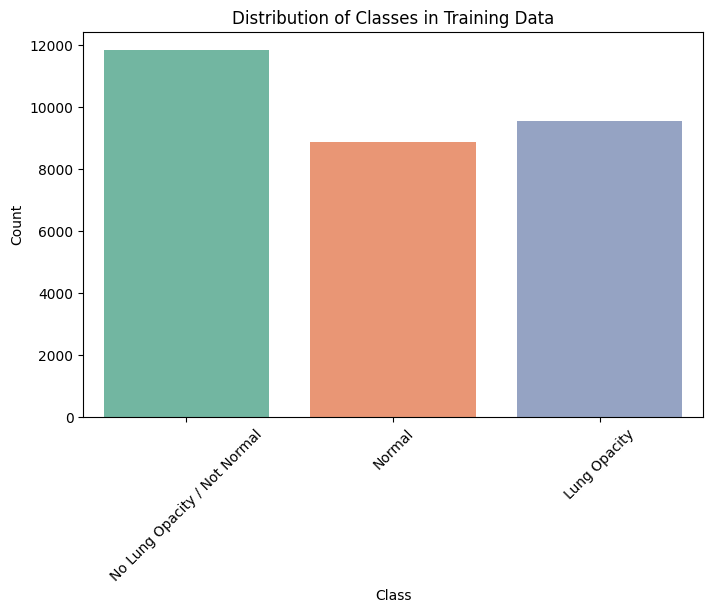

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

# Class distribution count
class_distribution = train_data_merged['class'].value_counts()
print("\nClass distribution:\n", class_distribution)

# Visualize class distribution
plt.figure(figsize=(8, 5))
sns.countplot(x='class', data=train_data_merged, palette='Set2', hue='class')
plt.title("Distribution of Classes in Training Data")
plt.ylabel("Count")
plt.xlabel("Class")
plt.xticks(rotation=45)
plt.show()


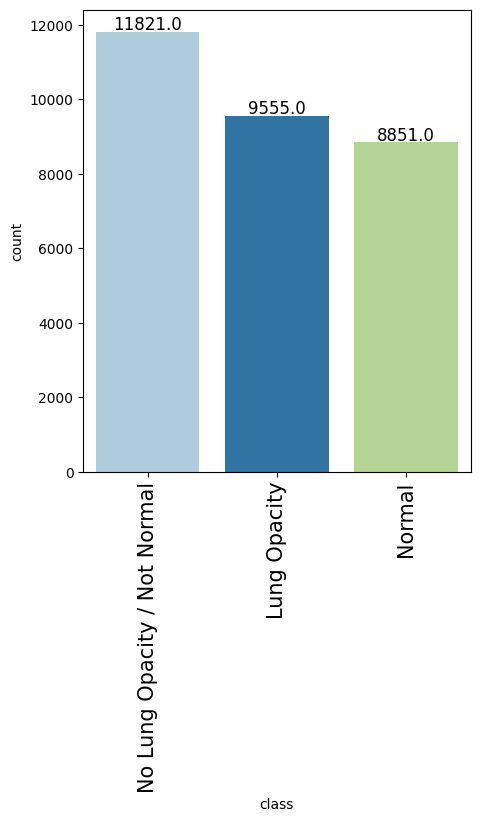

In [56]:
# function to create labeled barplots
def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 2, 6))
    else:
        plt.figure(figsize=(n + 2, 6))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

labeled_barplot(train_data_merged, "class")

### **Map Training Images to Their Annotations**

#### Map patient IDs to their bounding boxes

In [57]:
# Group annotations by patientId clearly
annotations_grouped = train_data_merged.groupby('patientId')

# Example: Display annotations for a specific patient clearly
sample_patient = train_data_merged[train_data_merged['Target'] == 1]['patientId'].iloc[0]

print(f"\nBounding Boxes for patientId '{sample_patient}':")
print(annotations_grouped.get_group(sample_patient))



Bounding Boxes for patientId '00436515-870c-4b36-a041-de91049b9ab4':
                              patientId      x      y  width  height  Target  \
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1   
5  00436515-870c-4b36-a041-de91049b9ab4  562.0  152.0  256.0   453.0       1   

          class  
4  Lung Opacity  
5  Lung Opacity  


#### Create a convenient annotation dictionary

In [58]:
# Create dictionary mapping patientId to list of bounding boxes (coordinates)
bbox_dict = {}

for patientId, group in annotations_grouped:
    bboxes = group[['x', 'y', 'width', 'height', 'Target']].values
    bbox_dict[patientId] = bboxes

# Verify clearly
print(f"Bounding boxes for patientId '{sample_patient}':")
print(bbox_dict[sample_patient])


Bounding boxes for patientId '00436515-870c-4b36-a041-de91049b9ab4':
[[        264         152         213         379           1]
 [        562         152         256         453           1]]


#### Summary of Bounding Box Data

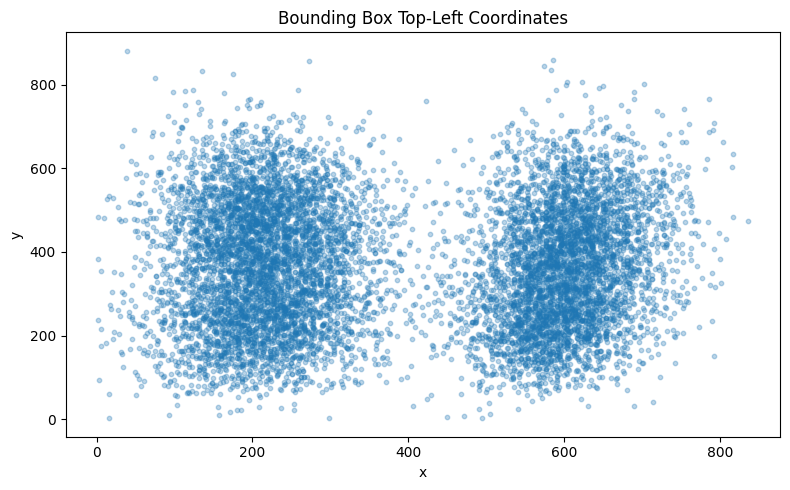

In [59]:
# Bounding boxes co-ordinates
plt.figure(figsize=(8, 5))
pneumonia_boxes = train_data_merged[train_data_merged['Target'] == 1]
plt.scatter(pneumonia_boxes['x'], pneumonia_boxes['y'], alpha=0.3, s=10)
plt.title("Bounding Box Top-Left Coordinates")
plt.xlabel("x")
plt.ylabel("y")
plt.tight_layout()
plt.show()

### Step 4: Preprocessing and Visualization of Different Classes

In [60]:
# Function to load and preprocess DICOM image
def load_dicom_image(patient_id, img_size=(224, 224)):
    """
    Load and preprocess a DICOM image for a given patient ID

    Parameters:
    - patient_id: ID of the patient
    - img_size: Tuple of (height, width) for resizing

    Returns:
    - Preprocessed image as numpy array
    """
    # zip_path = root_dir + 'stage_2_train_images.zip'
    # zip_archive = zipfile.ZipFile(zip_path, 'r')
    # print(patient_id)
    dicom_filename = f"{root_dir}/stage_2_train_images/{patient_id}.dcm"
    # if dicom_filename not in zip_archive.namelist():
    #     raise FileNotFoundError(f"{dicom_filename} not found in ZIP archive.")

    # Read file as bytes and load with pydicom
    # with zip_archive.open(dicom_filename) as file:
    #     dicom_bytes = file.read()
    #     dicom = pydicom.dcmread(io.BytesIO(dicom_bytes))
    dicom = pydicom.dcmread(dicom_filename)

    # Convert to numpy array
    image = dicom.pixel_array

    # Normalize pixel values to be between 0 and 1
    image = image / np.max(image)

    # Convert to grayscale if necessary
    if image.ndim > 2:
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Resize image
    image = cv2.resize(image, img_size[::-1])

    # Expand dimensions for CNN input (add channel dimension)
    image = np.expand_dims(image, axis=-1)

    return image

In [61]:
# Sample a few images from each class for visualization
def sample_patients_from_class(class_name, n=4):
    """Sample n patient IDs from a given class"""
    return random.sample(list(train_data_merged[train_data_merged['class'] == class_name]['patientId']), n)

# Sample patient IDs from each class
normal_patients = sample_patients_from_class('Normal',3)
opacity_patients = sample_patients_from_class('Lung Opacity',3)
not_normal_patients = sample_patients_from_class('No Lung Opacity / Not Normal',3)

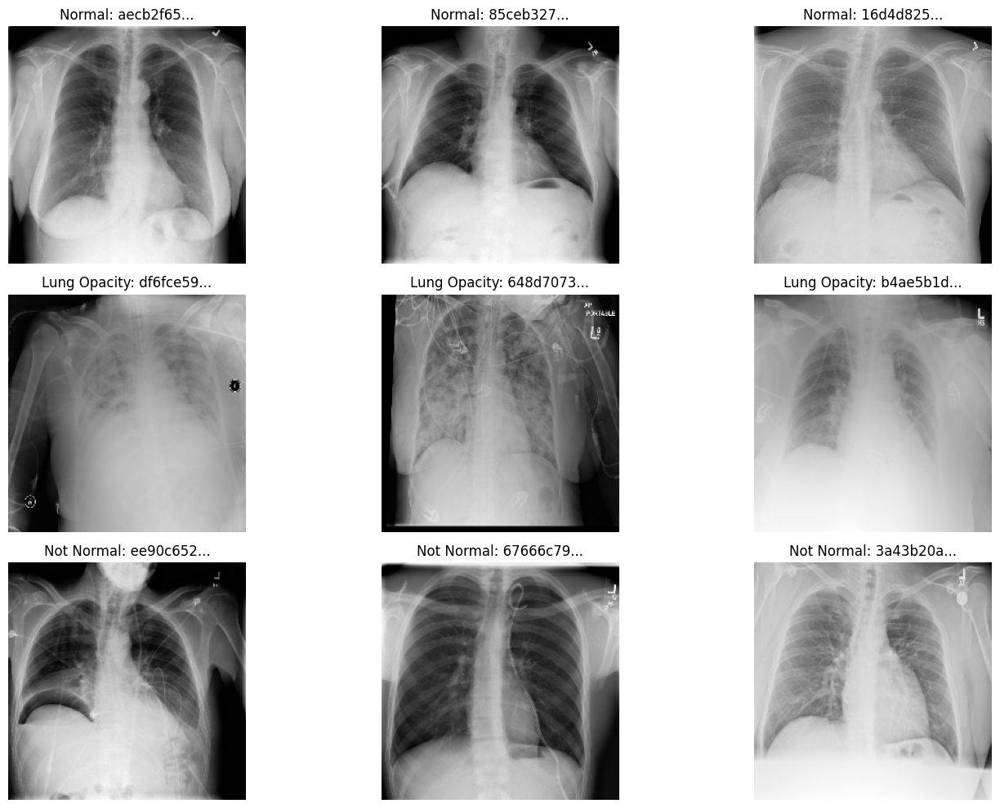

In [62]:
# Plot sample images from each class
plt.figure(figsize=(15, 10))

# Plot Normal images
for i, patient_id in enumerate(normal_patients):
    plt.subplot(3, 3, i+1)
    img = load_dicom_image(patient_id)
    plt.imshow(img[:, :, 0], cmap='gray')
    plt.title(f"Normal: {patient_id[:8]}...")
    plt.axis('off')

# Plot Lung Opacity images
for i, patient_id in enumerate(opacity_patients):
    plt.subplot(3, 3, i+4)
    img = load_dicom_image(patient_id)
    plt.imshow(img[:, :, 0], cmap='gray')
    plt.title(f"Lung Opacity: {patient_id[:8]}...")
    plt.axis('off')

# Plot Not Normal No Lung Opacity images
for i, patient_id in enumerate(not_normal_patients):
    plt.subplot(3, 3, i+7)
    img = load_dicom_image(patient_id)
    plt.imshow(img[:, :, 0], cmap='gray')
    plt.title(f"Not Normal: {patient_id[:8]}...")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [63]:
# Function to load DICOM image with original size
def load_original_dicom(patient_id):
    """Load DICOM image without resizing"""
    # zip_path = root_dir + 'stage_2_train_images.zip'
    # zip_archive = zipfile.ZipFile(zip_path, 'r')

    dicom_filename = f"stage_2_train_images/{patient_id}.dcm"

    # if dicom_filename not in zip_archive.namelist():
    #     raise FileNotFoundError(f"{dicom_filename} not found in ZIP archive.")

    # Read file as bytes and load with pydicom
    # with zip_archive.open(dicom_filename) as file:
    #     dicom_bytes = file.read()
    #     dicom = pydicom.dcmread(io.BytesIO(dicom_bytes))

    dicom = pydicom.dcmread(root_dir + dicom_filename)
    image = dicom.pixel_array
    image = image / np.max(image)
    if image.ndim > 2:
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    return image

In [64]:
# Function to draw bounding boxes on image
def draw_boxes(image, boxes):
    """Draw bounding boxes on the image"""

    # Ensure image is in uint8 format (0-255)
    if image.dtype != np.uint8:
        # Normalize to 0-255 and convert to uint8
        image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)
        image = image.astype(np.uint8)

    # Convert grayscale image to RGB for colored boxes
    image_color = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

    for box in boxes:
        x, y = int(box['x']), int(box['y'])
        w, h = int(box['width']), int(box['height'])
        image_color = cv2.rectangle(image_color, (x, y), (x + w, y + h), (255, 0, 0), 2)

    return image_color

In [65]:
# Create a mapping of patient IDs to their respective bounding boxes
patient_boxes = {}
for index, row in train_data_merged.iterrows():
    patient_id = row['patientId']
    target = row['Target']

    if target == 1:  # Only consider rows with Target=1 (has bounding box)
        if patient_id not in patient_boxes:
            patient_boxes[patient_id] = []

        # Add bounding box coordinates
        patient_boxes[patient_id].append({
            'x': row['x'],
            'y': row['y'],
            'width': row['width'],
            'height': row['height']
        })

# Sample a few patients with Lung Opacity (which have bounding boxes)
opacity_patients = sample_patients_from_class('Lung Opacity')
opacity_with_boxes = [pid for pid in opacity_patients if pid in patient_boxes]

if not opacity_with_boxes:
    opacity_with_boxes = list(set(patient_boxes.keys()) &
                             set(train_data_merged[train_data_merged['class'] == 'Lung Opacity']['patientId']))[:4]


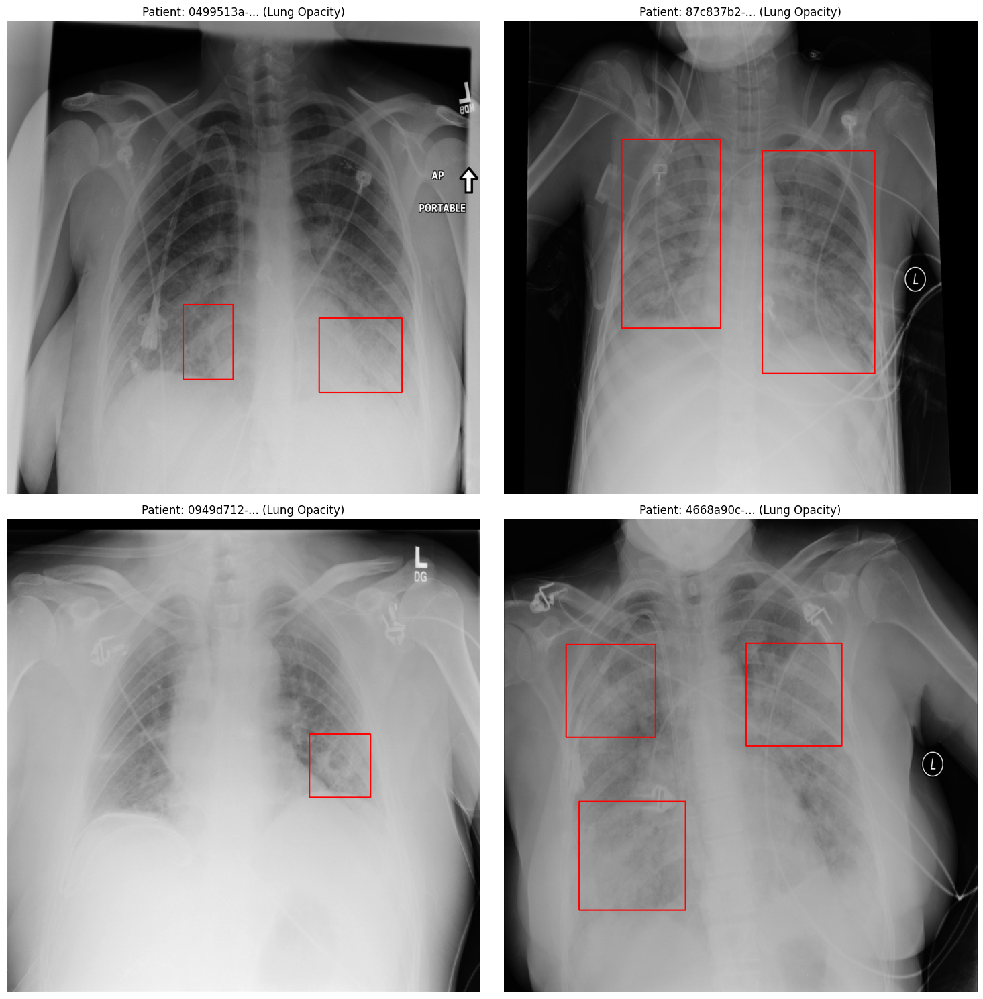

In [66]:
# Plot images with bounding boxes
plt.figure(figsize=(15, 15))

for i, patient_id in enumerate(opacity_with_boxes[:4]):
    try:
        plt.subplot(2, 2, i + 1)
        img = load_original_dicom(patient_id)

        if img is None:
            print(f"[Warning] Image for patient {patient_id} is None.")
            continue

        if patient_id in patient_boxes:
            img_with_boxes = draw_boxes(img, patient_boxes[patient_id])
            plt.imshow(img_with_boxes, cmap='gray')
        else:
            plt.imshow(img, cmap='gray')

        plt.title(f"Patient: {patient_id[:9]}... (Lung Opacity)")
        plt.axis('off')

    except Exception as e:
        print(f"[Error] Failed on patient {patient_id}: {e}")

plt.tight_layout()
plt.show()


#### **Inspect distribution of bounding box dimensions**

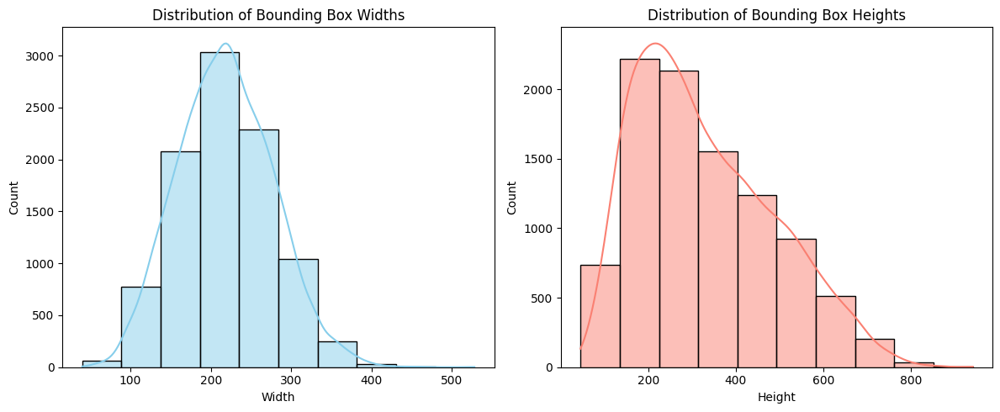

In [67]:
# Visualize distribution of bounding box dimensions
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(train_data_merged['width'], bins=10, kde=True, color='skyblue')
plt.title('Distribution of Bounding Box Widths')
plt.xlabel('Width')

plt.subplot(1,2,2)
sns.histplot(train_data_merged['height'], bins=10, kde=True, color='salmon')
plt.title('Distribution of Bounding Box Heights')
plt.xlabel('Height')

plt.tight_layout()
plt.show()


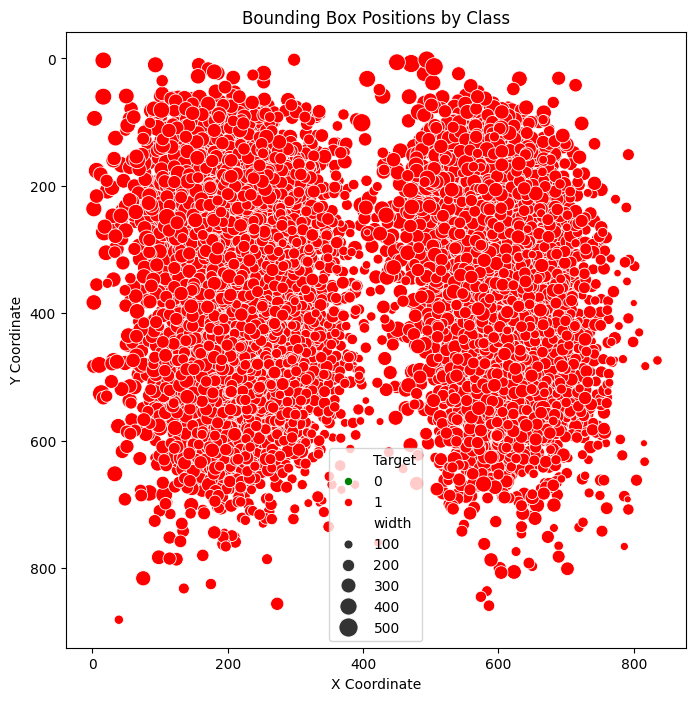

In [68]:
# Create a scatter plot of bounding box positions
plt.figure(figsize=(8,8))
sns.scatterplot(
    x='x', y='y',
    hue='Target',
    size='width', sizes=(20, 200),
    data=train_data_merged, palette=['green', 'red']
)
plt.title('Bounding Box Positions by Class')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.gca().invert_yaxis()  # Invert Y-axis to match image coordinates
plt.show()

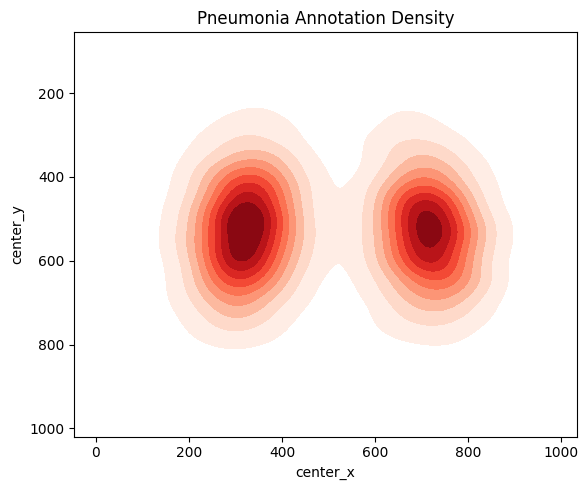

In [69]:
# Calculate centers of bounding boxes
train_data_merged['center_x'] = train_data_merged['x'] + train_data_merged['width']/2
train_data_merged['center_y'] = train_data_merged['y'] + train_data_merged['height']/2

# Create separate DataFrames for each class
pneumonia_df = train_data_merged[train_data_merged['Target'] == 1]

# Plot heatmap
plt.figure(figsize=(6, 5))
sns.kdeplot(x=pneumonia_df['center_x'], y=pneumonia_df['center_y'],
            cmap='Reds', fill=True)
plt.title('Pneumonia Annotation Density')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


### **Design, Train, and Test Basic CNN Models**

In [70]:
gpus = tf.config.list_physical_devices("GPU")
if gpus:
    try:
        # Enable memory growth to prevent TensorFlow from consuming all memory
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("GPUs available and configured:", len(gpus))
    except RuntimeError as e:
        print("Error setting up GPU:", e)
else:
    print("Using CPU")


Using CPU


In [71]:
# Parameters
img_size = (256, 256)
input_dir = root_dir + 'stage_2_train_images/'
output_dir = root_dir + 'preprocessed_images/'
num_classes = 3
batch_size = 32

In [72]:
def preprocess_dicom_images_from_folder(input_dir, output_dir):
    """
    Reads all .dcm files from a directory and saves them as .npy files.
    Files are located inside a folder like: input_dir/stage_2_train_images/
    """
    os.makedirs(output_dir, exist_ok=True)

    # Walk through the directory to find .dcm files
    for root, _, files in os.walk(input_dir):
        for file_name in files:
            if file_name.endswith('.dcm'):
                dicom_path = os.path.join(root, file_name)
                try:
                    dicom = pydicom.dcmread(dicom_path, force=True)
                    if not hasattr(dicom.file_meta, 'TransferSyntaxUID'):
                         dicom.file_meta.TransferSyntaxUID = pydicom.uid.ExplicitVRLittleEndian
                    image = dicom.pixel_array.astype(np.float32)

                    # Normalize
                    image /= np.max(image)

                    # Convert to grayscale if needed
                    if image.ndim > 2:
                        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

                    # Resize
                    image = cv2.resize(image, img_size[::-1])
                    image = np.expand_dims(image, axis=-1)

                    # Save with .npy extension
                    npy_name = file_name.replace('.dcm', '.npy')
                    np.save(os.path.join(output_dir, npy_name), image)

                except Exception as e:
                    print(f"[WARN] Skipping {dicom_path}: {e}")

In [73]:
# preprocess_dicom_images_from_folder(input_dir, output_dir)

In [74]:
# Load preprocessed data as tf.data.Dataset
def load_dataset_from_dataframe(df, img_dir, batch_size, num_classes):
    filepaths = [os.path.join(img_dir, f"{pid}.npy") for pid in df['patientId']]
    labels = df['class_encoded'].values

    def load_npy_and_label(path, label):
        image = tf.numpy_function(np.load, [path], tf.float32)
        image.set_shape([img_size[0], img_size[1], 1])
        label = tf.one_hot(label, depth=num_classes)
        return image, label

    dataset = tf.data.Dataset.from_tensor_slices((filepaths, labels))
    dataset = dataset.map(load_npy_and_label, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(1024).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

In [75]:
label_encoder = LabelEncoder()
train_data_merged['class_encoded'] = label_encoder.fit_transform(train_data_merged['class'])

In [76]:
# Train / Val split
train_df, val_df = train_test_split(train_data_merged, test_size=0.2, stratify=train_data_merged['class_encoded'], random_state=42)

In [77]:
train_ds = load_dataset_from_dataframe(train_df, output_dir, batch_size, num_classes)
val_ds = load_dataset_from_dataframe(val_df, output_dir, batch_size, num_classes)

In [78]:
# Model Builder Class
class ModelBuilder:
    def __init__(self, input_shape, num_classes=3):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build_basic_cnn(self):
        return models.Sequential([
            layers.Conv2D(32, (3,3), activation='relu', input_shape=self.input_shape),
            layers.MaxPooling2D(2, 2),
            layers.Conv2D(64, (3,3), activation='relu'),
            layers.MaxPooling2D(2, 2),
            layers.Conv2D(128, (3,3), activation='relu'),
            layers.MaxPooling2D(2, 2),
            layers.Flatten(),
            layers.Dense(128, activation='relu'),
            layers.Dropout(0.5),
            layers.Dense(self.num_classes, activation='softmax')
        ])

    def build_deeper_cnn(self):
        model = Sequential([
            Conv2D(32, (3,3), activation='relu', input_shape=self.input_shape),
            MaxPooling2D(2, 2),
            Dropout(0.1),
            Conv2D(64, (3,3), activation='relu'),
            MaxPooling2D(2, 2),
            Dropout(0.2),
            Conv2D(128, (3,3), activation='relu'),
            MaxPooling2D(2, 2),
            Dropout(0.3),
            Conv2D(256, (3,3), activation='relu'),
            MaxPooling2D(2, 2),
            Flatten(),
            Dense(256, activation='relu'),
            Dropout(0.5),
            Dense(self.num_classes, activation='softmax')
        ])
        return model

    def build_lenet5(self):
        model = Sequential([
            Input(shape=self.input_shape),
            Conv2D(6, kernel_size=(5, 5), activation='tanh'),
            AveragePooling2D(pool_size=(2, 2)),
            Conv2D(16, kernel_size=(5, 5), activation='tanh'),
            AveragePooling2D(pool_size=(2, 2)),
            Flatten(),
            Dense(120, activation='tanh'),
            Dense(84, activation='tanh'),
            Dense(self.num_classes, activation='softmax')
        ])
        return model

    def build_mobilenetv2(self):
        base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=self.input_shape)
        base_model.trainable = False

        inputs = Input(self.input_shape)
        x = base_model(inputs, training=False)
        x = GlobalAveragePooling2D()(x)
        x = Dense(128, activation='relu')(x)
        outputs = Dense(self.num_classes, activation='softmax')(x)

        model = Model(inputs, outputs)
        return model


In [79]:
def replicate_grayscale_channels(image, label):
    image = tf.image.grayscale_to_rgb(image)  # Convert [H,W,1] to [H,W,3]
    return image, label

In [80]:
# callback method
def setup_callbacks(model_name='pneumonia_model_best'):
    """Setup optimized training callbacks"""
    return [
        callbacks.ModelCheckpoint(
            f'{model_name}.keras',
            save_best_only=True,
        ),
        callbacks.EarlyStopping(
            patience=5,
            restore_best_weights=True
        ),
        callbacks.ReduceLROnPlateau(
            patience=2
        ),
        callbacks.TerminateOnNaN()
    ]

In [81]:
def train_and_evaluate(model_type, train_ds, val_ds, input_shape, num_classes, epochs=10):
    builder = ModelBuilder(input_shape, num_classes)

    if model_type == 'BasicCNN':
        model = builder.build_basic_cnn()
    elif model_type == 'DeeperCNN':
        model = builder.build_deeper_cnn()
    elif model_type == 'MobileNetV2':
        model = builder.build_mobilenetv2()

        # Convert grayscale to 3-channel RGB for MobileNetV2
        train_ds = train_ds.map(replicate_grayscale_channels, num_parallel_calls=tf.data.AUTOTUNE)
        val_ds = val_ds.map(replicate_grayscale_channels, num_parallel_calls=tf.data.AUTOTUNE)

    elif model_type == 'LeNet5':
        model = builder.build_lenet5()
    else:
        raise ValueError(f"Unsupported model type: {model_type}")

    model.compile(
        optimizer=optimizers.Adam(1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    print(model.summary())

    history = model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=setup_callbacks(model_name=f"{model_type}_best_model"), verbose=1)
    return model, history

In [82]:
def plot_training_history(history):
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    axes[0].plot(history.history['accuracy'], label='Training', linewidth=2)
    axes[0].plot(history.history['val_accuracy'], label='Validation', linewidth=2)
    axes[0].set_title('Model Accuracy', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(history.history['loss'], label='Training', linewidth=2)
    axes[1].plot(history.history['val_loss'], label='Validation', linewidth=2)
    axes[1].set_title('Model Loss', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

In [83]:
def evaluate_model(model, val_ds, label_encoder):
    y_true, y_pred = [], []
    for batch_x, batch_y in val_ds:
        preds = model.predict(batch_x, verbose=0)
        y_true.extend(np.argmax(batch_y.numpy(), axis=1))
        y_pred.extend(np.argmax(preds, axis=1))

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    y_true_labels = label_encoder.inverse_transform(y_true)
    y_pred_labels = label_encoder.inverse_transform(y_pred)
    class_names = label_encoder.classes_

    print("\nClassification Report:")
    print("=" * 80)
    print(classification_report(y_true_labels, y_pred_labels, target_names=class_names, digits=4))

    # Plot confusion matrix
    print("\nConfusion Matrix")
    print("=" * 80)
    cm = confusion_matrix(y_true_labels, y_pred_labels, labels=class_names)
    plt.figure(figsize=(10, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix', fontsize=14, fontweight='bold')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

In [84]:
print >>>>Halt here model already trained<<<<

SyntaxError: invalid syntax (1081053369.py, line 1)

In [ ]:
# Train model
basic_model, basic_history = train_and_evaluate('BasicCNN', train_ds, val_ds, input_shape=(256, 256, 1), num_classes=3)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    14,745,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,838,787 (56.61 MB)

 Trainable params: 14,838,787 (56.61 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 761s 1s/step - accuracy: 0.5109 - loss: 0.9600 - val_accuracy: 0.5994 - val_loss: 0.8289 - learning_rate: 1.0000e-04
Epoch 2/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 658s 870ms/step - accuracy: 0.5856 - loss: 0.8625 - val_accuracy: 0.6186 - val_loss: 0.8164 - learning_rate: 1.0000e-04
Epoch 3/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 776s 1s/step - accuracy: 0.6006 - loss: 0.8338 - val_accuracy: 0.6317 - val_loss: 0.8059 - learning_rate: 1.0000e-04
Epoch 4/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 965s 1s/step - accuracy: 0.6141 - loss: 0.8139 - val_accuracy: 0.6237 - val_loss: 0.7954 - learning_rate: 1.0000e-04
Epoch 5/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 954s 1s/step - accuracy: 0.6285 - loss: 0.7868 - val_accuracy: 0.6454 - val_loss: 0.7750 - learning_rate: 1.0000e-04
Epoch 6/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 968s 1s/step - accuracy: 0.6356 - loss: 0.7717 - val_accuracy: 0.6492 - val_loss: 0.7620 - learning_rate: 1.0000e-04
Epoch 7/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 991s 1s/st

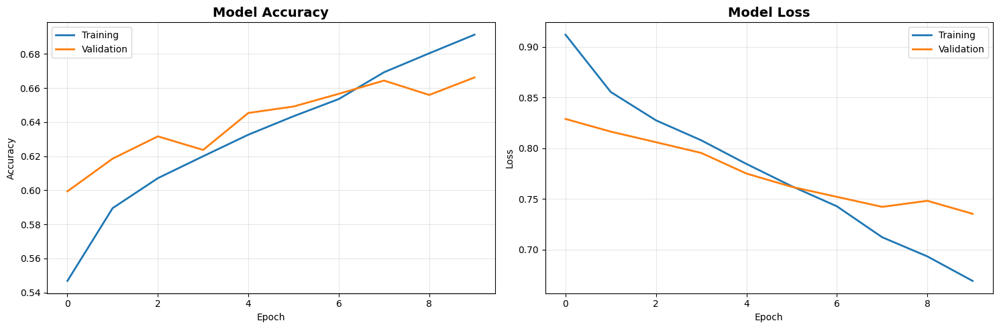

In [ ]:
# Plot training history
plot_training_history(basic_history)


Classification Report:
                              precision    recall  f1-score   support

                Lung Opacity     0.7081    0.6641    0.6854      1911
No Lung Opacity / Not Normal     0.5894    0.6245    0.6064      2365
                      Normal     0.7334    0.7243    0.7288      1770

                    accuracy                         0.6662      6046
                   macro avg     0.6770    0.6710    0.6736      6046
                weighted avg     0.6691    0.6662    0.6672      6046


Confusion Matrix


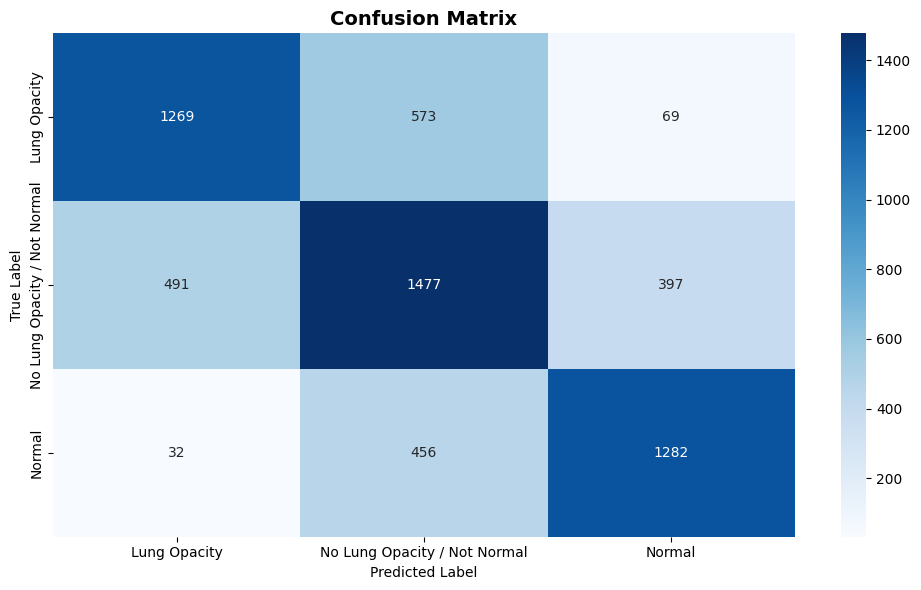

In [ ]:
#Evaluating basic model performance
evaluate_model(basic_model, val_ds, label_encoder)

In [ ]:
# Train model
mobilenet_model, mobilenet_history = train_and_evaluate('MobileNetV2', train_ds, val_ds, input_shape=(256, 256, 3), num_classes=3)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 8, 8, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,339 (9.24 MB)

 Trainable params: 164,355 (642.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

None
Epoch 1/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 674s 885ms/step - accuracy: 0.5882 - loss: 0.8571 - val_accuracy: 0.6623 - val_loss: 0.7268 - learning_rate: 1.0000e-04
Epoch 2/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 434s 573ms/step - accuracy: 0.6610 - loss: 0.7282 - val_accuracy: 0.6657 - val_loss: 0.7145 - learning_rate: 1.0000e-04
Epoch 3/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 453s 599ms/step - accuracy: 0.6716 - loss: 0.7053 - val_accuracy: 0.6662 - val_loss: 0.7154 - learning_rate: 1.0000e-04
Epoch 4/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 412s 544ms/step - accuracy: 0.6838 - loss: 0.6914 - val_accuracy: 0.6793 - val_loss: 0.6933 - learning_rate: 1.0000e-04
Epoch 5/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 470s 621ms/step - accuracy: 0.6885 - loss: 0.6803 - val_accuracy: 0.6687 - val_loss: 0.7182 - learning_rate: 1.0000e-04
Epoch 6/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 416s 549ms/step - accuracy: 0.6888 - loss: 0.6749 - val_accuracy: 0.6677 - val_loss: 0.7112 - learning_rate: 1.0000e-04
Epoch 7/10
756/756 ━━━━━━━━━━━━━━━━

In [ ]:
# Convert grayscale to 3-channel RGB for MobileNetV2
val_ds = val_ds.map(replicate_grayscale_channels, num_parallel_calls=tf.data.AUTOTUNE)

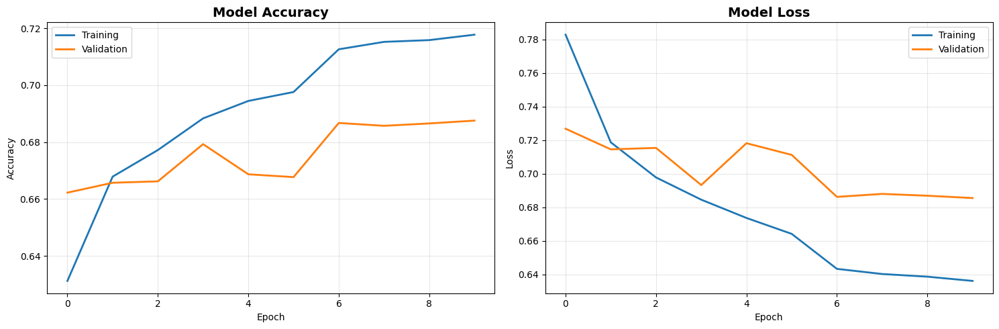

In [ ]:
# Plot training history
plot_training_history(mobilenet_history)


Classification Report:
                              precision    recall  f1-score   support

                Lung Opacity     0.7054    0.6703    0.6874      1911
No Lung Opacity / Not Normal     0.6216    0.6195    0.6205      2365
                      Normal     0.7533    0.7972    0.7746      1770

                    accuracy                         0.6876      6046
                   macro avg     0.6934    0.6957    0.6942      6046
                weighted avg     0.6866    0.6876    0.6868      6046


Confusion Matrix


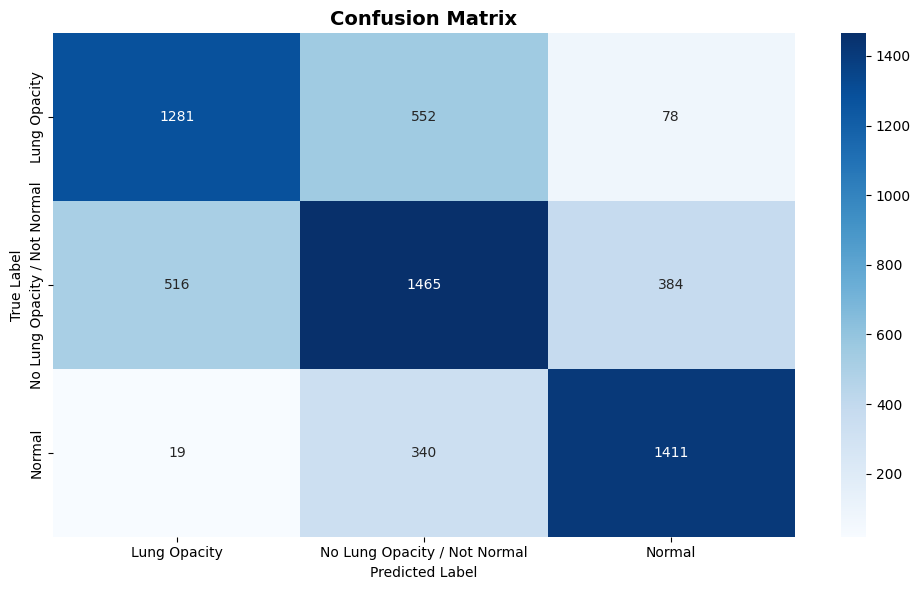

In [ ]:
#Evaluating mobilenet model performance
evaluate_model(mobilenet_model, val_ds, label_encoder)

In [ ]:
train_ds = load_dataset_from_dataframe(train_df, output_dir, batch_size, num_classes)
val_ds = load_dataset_from_dataframe(val_df, output_dir, batch_size, num_classes)

# Train model
lenet_model, lenet_history = train_and_evaluate('LeNet5', train_ds, val_ds, input_shape=(256, 256, 1), num_classes=3)

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 252, 252, 6)    │           156 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_2             │ (None, 126, 126, 6)    │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 122, 122, 16)   │         2,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_3             │ (None, 61, 61, 16)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 59536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 120)            │     7,144,440 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 84)             │        10,164 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 3)              │           255 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,157,431 (27.30 MB)

 Trainable params: 7,157,431 (27.30 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 93s 120ms/step - accuracy: 0.4802 - loss: 1.0502 - val_accuracy: 0.5688 - val_loss: 0.8751 - learning_rate: 1.0000e-04
Epoch 2/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 123s 162ms/step - accuracy: 0.5793 - loss: 0.8690 - val_accuracy: 0.5898 - val_loss: 0.8474 - learning_rate: 1.0000e-04
Epoch 3/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 106s 139ms/step - accuracy: 0.5938 - loss: 0.8384 - val_accuracy: 0.6113 - val_loss: 0.8172 - learning_rate: 1.0000e-04
Epoch 4/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 137s 180ms/step - accuracy: 0.6154 - loss: 0.7981 - val_accuracy: 0.6087 - val_loss: 0.8050 - learning_rate: 1.0000e-04
Epoch 5/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 165s 217ms/step - accuracy: 0.6406 - loss: 0.7616 - val_accuracy: 0.6250 - val_loss: 0.7770 - learning_rate: 1.0000e-04
Epoch 6/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 158s 208ms/step - accuracy: 0.6680 - loss: 0.7158 - val_accuracy: 0.6356 - val_loss: 0.7722 - learning_rate: 1.0000e-04
Epoch 7/10
756/756 ━━━━━━━━━━━━━━━━━

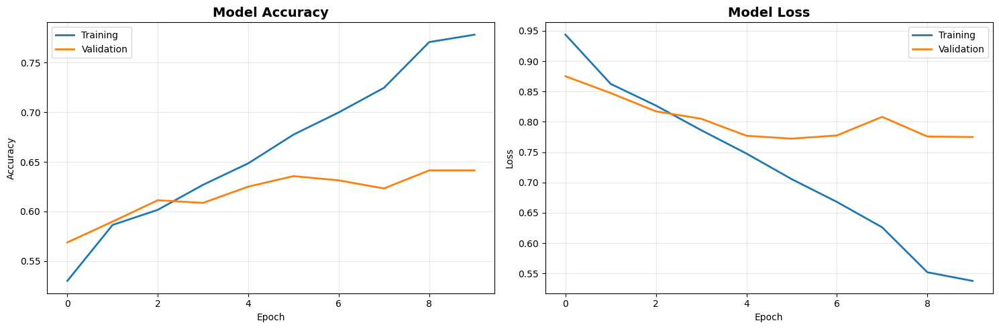

In [ ]:
# Plot training history
plot_training_history(lenet_history)


Classification Report:
                              precision    recall  f1-score   support

                Lung Opacity     0.6728    0.6264    0.6488      1911
No Lung Opacity / Not Normal     0.5638    0.5776    0.5706      2365
                      Normal     0.6941    0.7232    0.7084      1770

                    accuracy                         0.6356      6046
                   macro avg     0.6436    0.6424    0.6426      6046
                weighted avg     0.6364    0.6356    0.6356      6046


Confusion Matrix


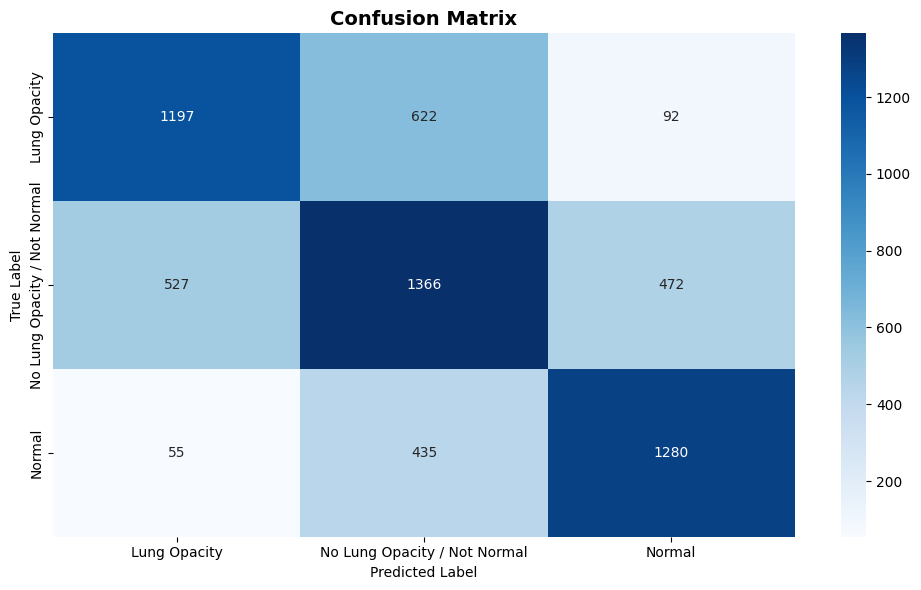

In [ ]:
#Evaluating lenet model performance
evaluate_model(lenet_model, val_ds, label_encoder)

In [ ]:
# Train model
deepcnn_model, deepcnn_history = train_and_evaluate('DeeperCNN', train_ds, val_ds, input_shape=(256, 256, 1), num_classes=3)

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_7 (Conv2D)               │ (None, 254, 254, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 256)            │    12,845,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 3)              │           771 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,233,923 (50.48 MB)

 Trainable params: 13,233,923 (50.48 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 935s 1s/step - accuracy: 0.4488 - loss: 1.0260 - val_accuracy: 0.5782 - val_loss: 0.9267 - learning_rate: 1.0000e-04
Epoch 2/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 958s 1s/step - accuracy: 0.5545 - loss: 0.9001 - val_accuracy: 0.6126 - val_loss: 0.8906 - learning_rate: 1.0000e-04
Epoch 3/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 1117s 1s/step - accuracy: 0.5824 - loss: 0.8646 - val_accuracy: 0.6183 - val_loss: 0.8495 - learning_rate: 1.0000e-04
Epoch 4/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 1215s 2s/step - accuracy: 0.5930 - loss: 0.8507 - val_accuracy: 0.6269 - val_loss: 0.8372 - learning_rate: 1.0000e-04
Epoch 5/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 910s 1s/step - accuracy: 0.6020 - loss: 0.8345 - val_accuracy: 0.6313 - val_loss: 0.8313 - learning_rate: 1.0000e-04
Epoch 6/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 1228s 2s/step - accuracy: 0.6172 - loss: 0.8191 - val_accuracy: 0.6416 - val_loss: 0.8083 - learning_rate: 1.0000e-04
Epoch 7/10
756/756 ━━━━━━━━━━━━━━━━━━━━ 1411s 2s/s

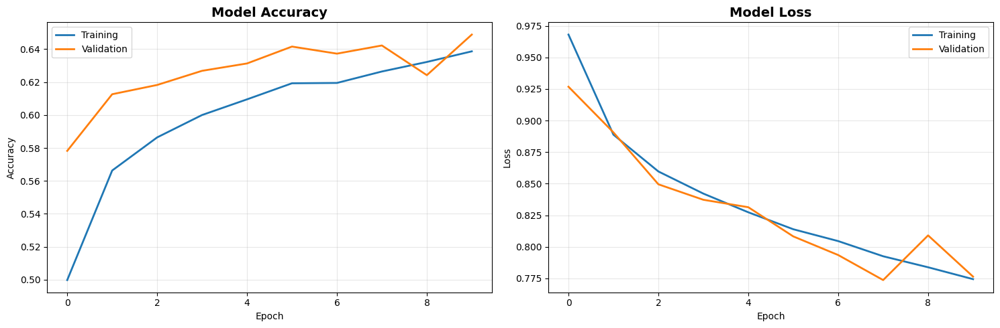

In [ ]:
# Plot training history
plot_training_history(deepcnn_history)


Classification Report:
                              precision    recall  f1-score   support

                Lung Opacity     0.7011    0.6039    0.6489      1911
No Lung Opacity / Not Normal     0.5753    0.5763    0.5758      2365
                      Normal     0.6726    0.7718    0.7188      1770

                    accuracy                         0.6422      6046
                   macro avg     0.6497    0.6506    0.6478      6046
                weighted avg     0.6436    0.6422    0.6408      6046


Confusion Matrix


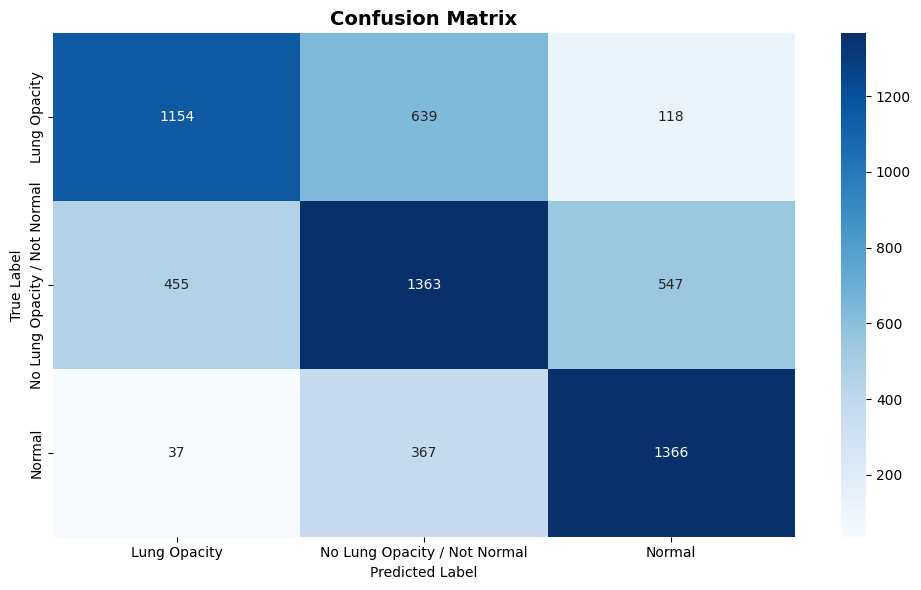

In [ ]:
#Evaluating deepcnn model performance
evaluate_model(deepcnn_model, val_ds, label_encoder)

### Yolov8 Model

#### Yolov8 Model training with 3 classes

In [91]:
import shutil
from ultralytics import YOLO

class YOLOPneumoniaDetectorWithThreeClass:
    def __init__(self, numpy_dir, csv_path, output_dir='yolo_dataset'):
        """
        :param numpy_dir: Directory containing Numpy files
        :param csv_path: Path to bounding box CSV
        :param output_dir: Output directory for YOLO format
        """
        self.numpy_dir = numpy_dir
        self.csv_path = csv_path
        self.output_dir = output_dir
        self.class_names =  {'Lung Opacity': 0, 
                         'No Lung Opacity / Not Normal': 1,
                         'Normal': 2}
        
        # Create directory structure
        self._create_dirs()
        
    def _create_dirs(self):
        """Create YOLO directory structure"""
        for split in ['train', 'val']:
            os.makedirs(os.path.join(self.output_dir, split, 'images'), exist_ok=True)
            os.makedirs(os.path.join(self.output_dir, split, 'labels'), exist_ok=True)
            
        # Create dataset YAML
        self._create_yaml()

    def prepare_yolo_dataset(self, df, test_size=0.2, img_size=1024):
        # Split patient IDs
        patient_ids = df['patientId'].unique()
        train_ids, val_ids = train_test_split(patient_ids, test_size=test_size, random_state=42)
        
        # Process splits
        # self._process_split(df, train_ids, 'train', img_size)
        # self._process_split(df, val_ids, 'val', img_size)
        
        # Create dataset YAML
        self._create_yaml()

    def _process_split(self, df, patient_ids, split, img_size):
        """Process a single split of the data"""
        for pid in patient_ids:
            # Npy to PNG conversion
            npy_path = os.path.join(self.numpy_dir, f"{pid}.npy")
            png_path = os.path.join(self.output_dir, split, 'images', f"{pid}.png")
            img = np.load(npy_path)
            img = (img - img.min()) / (img.max() - img.min()) * 255.0
            img = img.squeeze()
            Image.fromarray(img.astype(np.uint8)).save(png_path)
            # Create YOLO annotation file
            label_path = os.path.join(self.output_dir, split, 'labels', f"{pid}.txt")
            boxes = df[df['patientId'] == pid]
            with open(label_path, 'w') as f:
                for _, row in boxes.iterrows():
                    if pd.isna(row['x']) or pd.isna(row['y']) or pd.isna(row['width']) or pd.isna(row['height']):
                        continue  # Skip invalid boxes
                    x_center = (row['x'] + row['width']/2) / img_size
                    y_center = (row['y'] + row['height']/2) / img_size
                    width = row['width'] / img_size
                    height = row['height'] / img_size
                    class_id = self.class_names[row['class']]
                    f.write(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")

    def _create_yaml(self):
        """Create dataset YAML configuration"""
        yaml_content = f"""path: {os.path.abspath(self.output_dir)}
train: train/images
val: val/images
nc: 3
names: {list(self.class_names.keys())}
"""
        with open(os.path.join(self.output_dir, 'data.yaml'), 'w') as f:
            f.write(yaml_content)

    def train(self, model_name='yolov8n.pt', epochs=25, imgsz=1024, batch=2, tune=False):
        """Train YOLOv8 model with transfer learning"""
        self.model = YOLO(model_name)
        data_yaml = os.path.join(self.output_dir, 'data.yaml')
        
        if tune:
            search_space = {
                'lr0': (1e-5, 1e-2),
                'momentum': (0.85, 0.95),
                'weight_decay': (0.0001, 0.001),
                'mixup': (0.0, 0.2)
            }
            self.model.tune(
                data=data_yaml,
                epochs=epochs,
                imgsz=imgsz,
                batch=batch,
                space=search_space,
                iterations=5,
                plots=True,
                save=True,
                patience=2
            )
        else:
            first_conv = self.model.model.model[0].conv 
            new_conv = torch.nn.Conv2d(
                in_channels=1,
                out_channels=first_conv.out_channels,
                kernel_size=first_conv.kernel_size,
                stride=first_conv.stride,
                padding=first_conv.padding,
                bias=first_conv.bias is not None
            )
            if first_conv.weight.shape[1] == 3:
                new_conv.weight.data = first_conv.weight.data.mean(dim=1, keepdim=True)
            else:
                torch.nn.init.kaiming_normal_(new_conv.weight, mode='fan_out', nonlinearity='relu')

            self.model.model.model[0].conv = new_conv
            self.model.train(
                data=data_yaml,
                epochs=epochs,
                imgsz=imgsz,
                batch=batch,
                device="cuda",
                pretrained=True,
                optimizer='AdamW',
                lr0=1e-4,
                weight_decay=0.0005,
                warmup_epochs=3,
                box=7.5,
                cls=0.5,
                dfl=1.5,
                fliplr=0.5,
                mosaic=0.5,
                mixup=0.1,
                patience=5,
                workers=9
            )

    def evaluate(self):
        """Evaluate model performance"""
        metrics = self.model.val(
            data=os.path.join(self.output_dir, 'data.yaml'),
            split='val',
            plots=True,
            save_json=True
        )
        print(f"mAP50-95: {metrics.box.map:.4f}")
        print(f"Precision: {metrics.box.mp:.4f}")
        print(f"Recall: {metrics.box.mr:.4f}")
        return metrics

    def predict(self, numpy_path, conf=0.25):
        """Make prediction on a new image as numpy"""
        # Convert Numpy to temporary PNG
        img = np.load(numpy_path)
        img = (img - img.min()) / (img.max() - img.min()) * 255.0
        temp_img = "temp.png"
        Image.fromarray(img.astype(np.uint8)).save(temp_img)
        
        # Predict and clean up
        results = self.model.predict(temp_img, conf=conf)
        os.remove(temp_img)
        
        return results[0].boxes.data.cpu().numpy()

###### Yolov8n

In [92]:
import torch
torch.cuda.empty_cache()

yolo_images_input_dir = root_dir + r"preprocessed_images"
yolo_output_dir = root_dir + r"yolo_dir"

detector = YOLOPneumoniaDetectorWithThreeClass(
    numpy_dir=yolo_images_input_dir,
    csv_path=train_labels_path,
    output_dir="pneumonia_yolo_3chan_3classes_yolov8n"
)

# Prepare dataset
detector.prepare_yolo_dataset(df=train_data_merged, test_size=0.2, img_size=1024)

# Train with transfer learning
train_metrics = detector.train(model_name='yolov8n.pt', epochs=50, imgsz=256, batch=8, tune=False)

# Evaluate
metrics = detector.evaluate()

Ultralytics 8.3.151  Python-3.11.9 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2050, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=pneumonia_yolo_3chan_3classes_yolov8n\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=256, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=0.5, multi_scale=False, name=train18, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=5, perspective=0.0, plo

train: Scanning C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo_3chan_3classes_yolov8n\train\labels.cache... 22302 images, 16564 backgrounds, 0 corrupt: 100%|██████████| 22302/22302 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.30.2 ms, read: 61.213.6 MB/s, size: 33.0 KB)


val: Scanning C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo_3chan_3classes_yolov8n\val\labels... 6266 images, 4108 backgrounds, 0 corrupt: 100%|██████████| 6266/6266 [00:02<00:00, 2315.34it/s]


val: New cache created: C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo_3chan_3classes_yolov8n\val\labels.cache
Plotting labels to runs\detect\train18\labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 256 train, 256 val
Using 9 dataloader workers
Logging results to runs\detect\train18
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      0.42G      2.382      3.131      1.858          3        256: 100%|██████████| 2788/2788 [05:31<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:41<00:00,  9.54it/s]


                   all       6266       3444      0.257      0.303      0.182     0.0603

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.439G      2.216      2.831      1.696          8        256: 100%|██████████| 2788/2788 [03:55<00:00, 11.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:32<00:00, 12.01it/s]


                   all       6266       3444      0.352      0.286      0.239     0.0905

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.439G      2.134      2.697      1.657         10        256: 100%|██████████| 2788/2788 [04:09<00:00, 11.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:34<00:00, 11.44it/s]

                   all       6266       3444      0.468      0.351      0.343      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50     0.439G      2.097      2.635      1.627          4        256: 100%|██████████| 2788/2788 [04:39<00:00,  9.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:32<00:00, 11.99it/s]


                   all       6266       3444      0.408      0.347      0.314       0.12

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50     0.439G      2.095      2.591      1.613          2        256: 100%|██████████| 2788/2788 [04:27<00:00, 10.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:35<00:00, 10.99it/s]


                   all       6266       3444      0.411      0.349      0.319      0.126

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50     0.439G      2.061      2.584      1.595          7        256: 100%|██████████| 2788/2788 [06:28<00:00,  7.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:41<00:00,  9.36it/s]


                   all       6266       3444      0.465      0.355      0.353      0.135

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50     0.439G      2.052       2.54      1.589          4        256: 100%|██████████| 2788/2788 [06:45<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:50<00:00,  7.72it/s]


                   all       6266       3444      0.415      0.354      0.321      0.128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50     0.439G      2.034       2.51      1.574          6        256: 100%|██████████| 2788/2788 [08:14<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:58<00:00,  6.72it/s]


                   all       6266       3444      0.419      0.389      0.351       0.14

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50     0.439G      2.031      2.496      1.574          5        256: 100%|██████████| 2788/2788 [06:58<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:57<00:00,  6.80it/s]


                   all       6266       3444      0.424       0.38      0.352       0.14

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50     0.439G      2.031      2.461      1.572          2        256: 100%|██████████| 2788/2788 [06:40<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:56<00:00,  7.00it/s]


                   all       6266       3444      0.438      0.349      0.338      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50     0.439G      2.003      2.471      1.555          3        256: 100%|██████████| 2788/2788 [04:33<00:00, 10.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:34<00:00, 11.41it/s]

                   all       6266       3444      0.443       0.36      0.357      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.439G      1.997      2.479      1.542          5        256: 100%|██████████| 2788/2788 [04:02<00:00, 11.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:52<00:00,  7.42it/s]


                   all       6266       3444      0.442      0.382      0.362      0.146

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.439G      1.995      2.413      1.552          4        256: 100%|██████████| 2788/2788 [06:34<00:00,  7.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:52<00:00,  7.41it/s]


                   all       6266       3444      0.403      0.409      0.356      0.149

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.439G      1.976       2.42      1.533          0        256: 100%|██████████| 2788/2788 [06:20<00:00,  7.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:49<00:00,  7.89it/s]


                   all       6266       3444      0.457      0.394      0.384      0.155

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.439G      1.974      2.392      1.529          2        256: 100%|██████████| 2788/2788 [04:36<00:00, 10.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:34<00:00, 11.46it/s]


                   all       6266       3444      0.435      0.402      0.374      0.152

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.439G      1.996      2.412       1.54          3        256: 100%|██████████| 2788/2788 [04:18<00:00, 10.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:34<00:00, 11.33it/s]


                   all       6266       3444       0.42      0.411      0.369      0.152

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.439G      1.971      2.412      1.531          3        256: 100%|██████████| 2788/2788 [05:46<00:00,  8.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:41<00:00,  9.51it/s]

                   all       6266       3444       0.41       0.43      0.368      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.439G       1.98      2.382      1.544          6        256: 100%|██████████| 2788/2788 [04:42<00:00,  9.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:34<00:00, 11.39it/s]


                   all       6266       3444      0.415       0.42      0.373      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.439G      1.953      2.347      1.525          4        256: 100%|██████████| 2788/2788 [05:12<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:47<00:00,  8.30it/s]


                   all       6266       3444      0.425       0.41      0.373      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.439G      1.953       2.38      1.515          4        256: 100%|██████████| 2788/2788 [04:21<00:00, 10.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:35<00:00, 11.02it/s]

                   all       6266       3444      0.412       0.43      0.367      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.439G      1.965      2.377      1.535          7        256: 100%|██████████| 2788/2788 [04:22<00:00, 10.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:35<00:00, 10.95it/s]


                   all       6266       3444      0.413      0.431      0.373      0.155

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50     0.439G      1.944      2.353      1.517          5        256: 100%|██████████| 2788/2788 [04:16<00:00, 10.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:34<00:00, 11.46it/s]


                   all       6266       3444      0.413      0.437      0.379      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50     0.439G      1.955      2.326      1.525          0        256: 100%|██████████| 2788/2788 [04:15<00:00, 10.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:33<00:00, 11.56it/s]

                   all       6266       3444      0.406      0.434      0.371      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50     0.439G      1.956      2.325      1.525          5        256: 100%|██████████| 2788/2788 [04:14<00:00, 10.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:33<00:00, 11.60it/s]

                   all       6266       3444      0.416      0.434      0.381       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50     0.439G      1.937      2.337      1.516          1        256: 100%|██████████| 2788/2788 [04:14<00:00, 10.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:32<00:00, 11.95it/s]

                   all       6266       3444      0.417      0.434      0.378      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50     0.439G      1.932      2.312      1.512          1        256: 100%|██████████| 2788/2788 [04:34<00:00, 10.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:33<00:00, 11.57it/s]


                   all       6266       3444      0.415      0.435      0.379      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50     0.439G      1.937      2.312      1.512          4        256: 100%|██████████| 2788/2788 [04:19<00:00, 10.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:32<00:00, 12.04it/s]

                   all       6266       3444      0.414      0.434      0.382      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50     0.439G      1.943      2.318      1.514          3        256: 100%|██████████| 2788/2788 [03:50<00:00, 12.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:33<00:00, 11.81it/s]

                   all       6266       3444      0.418      0.445      0.385      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50     0.439G      1.951      2.319      1.511          2        256: 100%|██████████| 2788/2788 [04:21<00:00, 10.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:36<00:00, 10.69it/s]


                   all       6266       3444      0.416       0.45      0.388      0.163

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50     0.439G      1.919       2.29      1.501          1        256: 100%|██████████| 2788/2788 [04:28<00:00, 10.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:36<00:00, 10.83it/s]


                   all       6266       3444      0.419       0.45      0.386      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50     0.439G      1.919      2.318        1.5          2        256: 100%|██████████| 2788/2788 [04:21<00:00, 10.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:36<00:00, 10.72it/s]


                   all       6266       3444      0.407      0.442      0.382      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50     0.439G      1.916      2.286      1.504          2        256: 100%|██████████| 2788/2788 [04:28<00:00, 10.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:33<00:00, 11.72it/s]

                   all       6266       3444      0.402      0.447      0.379      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50     0.439G      1.928      2.297      1.514          4        256: 100%|██████████| 2788/2788 [04:10<00:00, 11.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:34<00:00, 11.46it/s]

                   all       6266       3444      0.413      0.454      0.384      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50     0.439G      1.883      2.268      1.484          0        256: 100%|██████████| 2788/2788 [04:09<00:00, 11.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:33<00:00, 11.85it/s]

                   all       6266       3444      0.414      0.453      0.386      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50     0.439G      1.915      2.289      1.498          5        256: 100%|██████████| 2788/2788 [04:12<00:00, 11.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:33<00:00, 11.53it/s]


                   all       6266       3444      0.415      0.454      0.388      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50     0.439G      1.898      2.272      1.486          3        256: 100%|██████████| 2788/2788 [05:42<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:36<00:00, 10.85it/s]

                   all       6266       3444      0.413      0.458      0.384      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50     0.439G      1.919      2.275       1.51          2        256: 100%|██████████| 2788/2788 [04:21<00:00, 10.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:32<00:00, 11.96it/s]

                   all       6266       3444      0.412      0.457      0.382      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50     0.439G      1.895      2.263      1.481          9        256: 100%|██████████| 2788/2788 [04:22<00:00, 10.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:35<00:00, 11.03it/s]


                   all       6266       3444       0.41       0.46      0.382      0.163

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50     0.439G      1.907      2.237      1.497          5        256: 100%|██████████| 2788/2788 [05:04<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:34<00:00, 11.38it/s]


                   all       6266       3444      0.411      0.456      0.382      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50     0.439G      1.894      2.259      1.489          0        256: 100%|██████████| 2788/2788 [06:02<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:55<00:00,  7.11it/s]


                   all       6266       3444      0.411      0.457      0.383      0.163
EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 35, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

40 epochs completed in 3.746 hours.
Optimizer stripped from runs\detect\train18\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train18\weights\best.pt, 6.2MB

Validating runs\detect\train18\weights\best.pt...
Ultralytics 8.3.151  Python-3.11.9 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2050, 4096MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:45<00:00,  8.64it/s]


                   all       6266       3444      0.417      0.455      0.389      0.165
          Lung Opacity       2158       3444      0.417      0.455      0.389      0.165
Speed: 0.1ms preprocess, 1.8ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs\detect\train18
Ultralytics 8.3.151  Python-3.11.9 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2050, 4096MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 222.953.4 MB/s, size: 34.6 KB)


val: Scanning C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo_3chan_3classes_yolov8n\val\labels.cache... 6266 images, 4108 backgrounds, 0 corrupt: 100%|██████████| 6266/6266 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 784/784 [00:48<00:00, 16.22it/s]


                   all       6266       3444      0.418      0.451      0.388      0.164
          Lung Opacity       2158       3444      0.418      0.451      0.388      0.164
Speed: 0.1ms preprocess, 2.4ms inference, 0.0ms loss, 1.8ms postprocess per image
Saving runs\detect\train182\predictions.json...
Results saved to runs\detect\train182
mAP50-95: 0.1643
Precision: 0.4184
Recall: 0.4512


###### Yolov8s

In [ ]:
import torch
torch.cuda.empty_cache()

yolo_images_input_dir = root_dir + r"preprocessed_images"
yolo_output_dir = root_dir + r"yolo_dir"

detector = YOLOPneumoniaDetectorWithThreeClass(
    numpy_dir=yolo_images_input_dir,
    csv_path=train_labels_path,
    output_dir="pneumonia_yolo_3chan_3classes_yolov8s"
)

# Prepare dataset
detector.prepare_yolo_dataset(df=train_data_merged, test_size=0.2, img_size=1024)

# Train with transfer learning
train_metrics = detector.train(model_name='yolov8s.pt', epochs=50, imgsz=256, batch=8, tune=False)

# Evaluate
metrics = detector.evaluate()

New https://pypi.org/project/ultralytics/8.3.154 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.151  Python-3.11.9 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2050, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=pneumonia_yolo\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=256, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=0.5, multi_scale=False, name=train17, nbs=64, nms=False, opset=None, optimi

train: Scanning C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo\train\labels.cache... 22302 images, 16564 backgrounds, 0 corrupt: 100%|██████████| 22302/22302 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.40.2 ms, read: 66.820.0 MB/s, size: 33.0 KB)


val: Scanning C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo\val\labels.cache... 6266 images, 4108 backgrounds, 0 corrupt: 100%|██████████| 6266/6266 [00:00<?, ?it/s]


Plotting labels to runs\detect\train17\labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 256 train, 256 val
Using 8 dataloader workers
Logging results to runs\detect\train17
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10     0.719G      2.303      3.282      1.854          0        256:  23%|██▎       | 632/2788 [01:23<05:06,  7.02it/s]

##### Yolov8 With single class

In [ ]:
import shutil
from ultralytics import YOLO

class YOLOPneumoniaDetector:
    def __init__(self, numpy_dir, csv_path, output_dir='yolo_dataset'):
        """
        :param numpy_dir: Directory containing DICOM files
        :param csv_path: Path to bounding box CSV
        :param output_dir: Output directory for YOLO format
        """
        self.numpy_dir = numpy_dir
        self.csv_path = csv_path
        self.output_dir = output_dir
        self.class_names = ['Lung Opacity']
        
        # Create directory structure
        self._create_dirs()
        
    def _create_dirs(self):
        """Create YOLO directory structure"""
        for split in ['train', 'val']:
            os.makedirs(os.path.join(self.output_dir, split, 'images'), exist_ok=True)
            os.makedirs(os.path.join(self.output_dir, split, 'labels'), exist_ok=True)

    def prepare_yolo_dataset(self, df, test_size=0.2, img_size=1024):
        """Convert Numpy and annotations to YOLO format"""
        df = df[df['Target'] == 1]  # Only keep pneumonia cases
        
        # Split patient IDs
        patient_ids = df['patientId'].unique()
        train_ids, val_ids = train_test_split(patient_ids, test_size=test_size, random_state=42)
        
        # Process splits
        self._process_split(df, train_ids, 'train', img_size)
        self._process_split(df, val_ids, 'val', img_size)

    def _process_split(self, df, patient_ids, split, img_size):
        """Process a single split of the data"""
        for pid in patient_ids:
            # Npy to PNG conversion
            npy_path = os.path.join(self.numpy_dir, f"{pid}.npy")
            png_path = os.path.join(self.output_dir, split, 'images', f"{pid}.png")
            img = np.load(npy_path)
            img = (img - img.min()) / (img.max() - img.min()) * 255.0
            img = img.squeeze()
            Image.fromarray(img.astype(np.uint8)).save(png_path)
            # Create YOLO annotation file
            label_path = os.path.join(self.output_dir, split, 'labels', f"{pid}.txt")
            boxes = df[df['patientId'] == pid]
            with open(label_path, 'w') as f:
                for _, row in boxes.iterrows():
                    x_center = (row['x'] + row['width']/2) / img_size
                    y_center = (row['y'] + row['height']/2) / img_size
                    width = row['width'] / img_size
                    height = row['height'] / img_size
                    f.write(f"0 {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")

    def _create_yaml(self):
        """Create dataset YAML configuration"""
        yaml_content = f"""path: {os.path.abspath(self.output_dir)}
train: train/images
val: val/images
names: {self.class_names}
"""
        with open(os.path.join(self.output_dir, 'data.yaml'), 'w') as f:
            f.write(yaml_content)

    def train(self, model_name='yolov8n.pt', epochs=25, imgsz=1024, batch=2, tune=False):
        """Train YOLOv8 model with transfer learning"""
        self.model = YOLO(model_name)
        data_yaml = os.path.join(self.output_dir, 'data.yaml')
        
        if tune:
            search_space = {
                'lr0': (1e-5, 1e-2),
                'momentum': (0.85, 0.95),
                'weight_decay': (0.0001, 0.001),
                'mixup': (0.0, 0.2)
            }
            self.model.tune(
                data=data_yaml,
                epochs=epochs,
                imgsz=imgsz,
                batch=batch,
                space=search_space,
                iterations=5,
                plots=True,
                save=True,
                patience=2
            )
        else:
            first_conv = self.model.model.model[0].conv 
            new_conv = torch.nn.Conv2d(
                in_channels=1,
                out_channels=first_conv.out_channels,
                kernel_size=first_conv.kernel_size,
                stride=first_conv.stride,
                padding=first_conv.padding,
                bias=first_conv.bias is not None
            )
            if first_conv.weight.shape[1] == 3:
                new_conv.weight.data = first_conv.weight.data.mean(dim=1, keepdim=True)
            else:
                torch.nn.init.kaiming_normal_(new_conv.weight, mode='fan_out', nonlinearity='relu')

            self.model.model.model[0].conv = new_conv
            self.model.train(
                data=data_yaml,
                epochs=epochs,
                imgsz=imgsz,
                batch=batch,
                device="cuda",
                pretrained=True,
                optimizer='AdamW',
                lr0=1e-4,
                weight_decay=0.0005,
                warmup_epochs=3,
                box=7.5,
                cls=0.5,
                dfl=1.5,
                fliplr=0.5,
                mosaic=0.5,
                mixup=0.1,
                patience=5
            )

    def evaluate(self):
        """Evaluate model performance"""
        metrics = self.model.val(
            data=os.path.join(self.output_dir, 'data.yaml'),
            split='val',
            plots=True,
            save_json=True
        )
        print(f"mAP50-95: {metrics.box.map:.4f}")
        print(f"Precision: {metrics.box.mp:.4f}")
        print(f"Recall: {metrics.box.mr:.4f}")
        return metrics

    def predict(self, numpy_path, conf=0.25):
        """Make prediction on a new image as numpy"""
        # Convert Numpy to temporary PNG
        img = np.load(numpy_path)
        img = (img - img.min()) / (img.max() - img.min()) * 255.0
        temp_img = "temp.png"
        Image.fromarray(img.astype(np.uint8)).save(temp_img)
        
        # Predict and clean up
        results = self.model.predict(temp_img, conf=conf)
        os.remove(temp_img)
        
        return results[0].boxes.data.cpu().numpy()

###### Yolov8n

In [ ]:
import torch
torch.cuda.empty_cache()

yolo_images_input_dir = root_dir + r"preprocessed_images"
yolo_output_dir = root_dir + r"yolo_dir"

detector = YOLOPneumoniaDetector(
    numpy_dir=yolo_images_input_dir,
    csv_path=train_labels_path,
    output_dir="pneumonia_yolo_single_class"
)

# Prepare dataset
detector.prepare_yolo_dataset(df=train_data_merged, test_size=0.2, img_size=1024)

# Train
train_metrics = detector.train(model_name='yolov8n.pt', epochs=50, imgsz=256, batch=8, tune=False)

# Evaluate
metrics = detector.evaluate()


###### Yolov8s

In [ ]:
import torch
torch.cuda.empty_cache()

yolo_images_input_dir = root_dir + r"preprocessed_images"
yolo_output_dir = root_dir + r"yolo_dir"

detector = YOLOPneumoniaDetector(
    numpy_dir=yolo_images_input_dir,
    csv_path=train_labels_path,
    output_dir="pneumonia_yolo_single_class"
)

# Prepare dataset
# detector.prepare_yolo_dataset(df=train_data_merged, test_size=0.2, img_size=1024)

# Train
train_metrics = detector.train(model_name='yolov8s.pt', epochs=10, imgsz=256, batch=8, tune=False)

# Evaluate
metrics = detector.evaluate()

New https://pypi.org/project/ultralytics/8.3.153 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.151  Python-3.11.9 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2050, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=pneumonia_yolo_single_class\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=256, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=0.5, multi_scale=False, name=train6, nbs=64, nms=False, opset=

train: Scanning C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo_single_class\train\labels.cache... 22302 images, 16564 backgrounds, 0 corrupt: 100%|██████████| 22302/22302 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.30.1 ms, read: 46.812.2 MB/s, size: 33.0 KB)


val: Scanning C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo_single_class\val\labels.cache... 6266 images, 4108 backgrounds, 0 corrupt: 100%|██████████| 6266/6266 [00:00<?, ?it/s]


Plotting labels to runs\detect\train6\labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 256 train, 256 val
Using 8 dataloader workers
Logging results to runs\detect\train6
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10     0.859G      2.157      2.832      1.727          0        256: 100%|██████████| 2788/2788 [05:11<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:38<00:00, 10.18it/s]

                   all       6266       3444     0.0796      0.615      0.172     0.0552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10     0.865G      1.999      2.497      1.586          0        256: 100%|██████████| 2788/2788 [06:44<00:00,  6.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  41%|████      | 160/392 [00:23<00:32,  7.09it/s]

WARNING NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [01:15<00:00,  5.21it/s]


                   all       6266       3444      0.398      0.334      0.306      0.116

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10     0.865G      1.935      2.389      1.539          2        256: 100%|██████████| 2788/2788 [07:27<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:48<00:00,  8.17it/s]


                   all       6266       3444      0.396      0.339      0.316      0.121

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10     0.865G      1.906      2.326      1.506          1        256: 100%|██████████| 2788/2788 [05:07<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:40<00:00,  9.70it/s]


                   all       6266       3444      0.391      0.343      0.316      0.131

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10     0.865G      1.853      2.268      1.475          2        256: 100%|██████████| 2788/2788 [04:32<00:00, 10.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:43<00:00,  9.04it/s]


                   all       6266       3444       0.42      0.379      0.353      0.144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10     0.865G      1.848      2.227      1.471          3        256: 100%|██████████| 2788/2788 [05:41<00:00,  8.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:49<00:00,  7.97it/s]


                   all       6266       3444      0.423      0.383      0.361       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10     0.865G      1.815      2.189      1.441          1        256: 100%|██████████| 2788/2788 [06:10<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:54<00:00,  7.15it/s]


                   all       6266       3444      0.393      0.398      0.359      0.152

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10     0.865G      1.814      2.172      1.448          5        256: 100%|██████████| 2788/2788 [05:59<00:00,  7.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:50<00:00,  7.71it/s]


                   all       6266       3444      0.388      0.382      0.332      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10     0.865G      1.807      2.149      1.438          2        256: 100%|██████████| 2788/2788 [05:56<00:00,  7.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:54<00:00,  7.21it/s]


                   all       6266       3444      0.421      0.431      0.384      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10     0.865G      1.757      2.099      1.407          4        256: 100%|██████████| 2788/2788 [06:01<00:00,  7.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:49<00:00,  7.93it/s]


                   all       6266       3444      0.405      0.438      0.379      0.162

10 epochs completed in 1.130 hours.
Optimizer stripped from runs\detect\train6\weights\last.pt, 22.5MB
Optimizer stripped from runs\detect\train6\weights\best.pt, 22.5MB

Validating runs\detect\train6\weights\best.pt...
Ultralytics 8.3.151  Python-3.11.9 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2050, 4096MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 392/392 [00:33<00:00, 11.68it/s]


                   all       6266       3444       0.42      0.431      0.384      0.164
Speed: 0.1ms preprocess, 2.0ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs\detect\train6
Ultralytics 8.3.151  Python-3.11.9 torch-2.0.1+cu117 CUDA:0 (NVIDIA GeForce RTX 2050, 4096MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 400.8102.3 MB/s, size: 34.6 KB)


val: Scanning C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo_single_class\val\labels.cache... 6266 images, 4108 backgrounds, 0 corrupt: 100%|██████████| 6266/6266 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 784/784 [00:47<00:00, 16.46it/s]


                   all       6266       3444      0.423      0.427      0.384      0.164
Speed: 0.1ms preprocess, 3.8ms inference, 0.0ms loss, 1.4ms postprocess per image
Saving runs\detect\train62\predictions.json...
Results saved to runs\detect\train62
mAP50-95: 0.1635
Precision: 0.4235
Recall: 0.4268



image 1/1 C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo\val\images\001031d9-f904-4a23-b3e5-2c088acd19c6.png: 256x256 (no detections), 17.6ms
Speed: 1.4ms preprocess, 17.6ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 256)


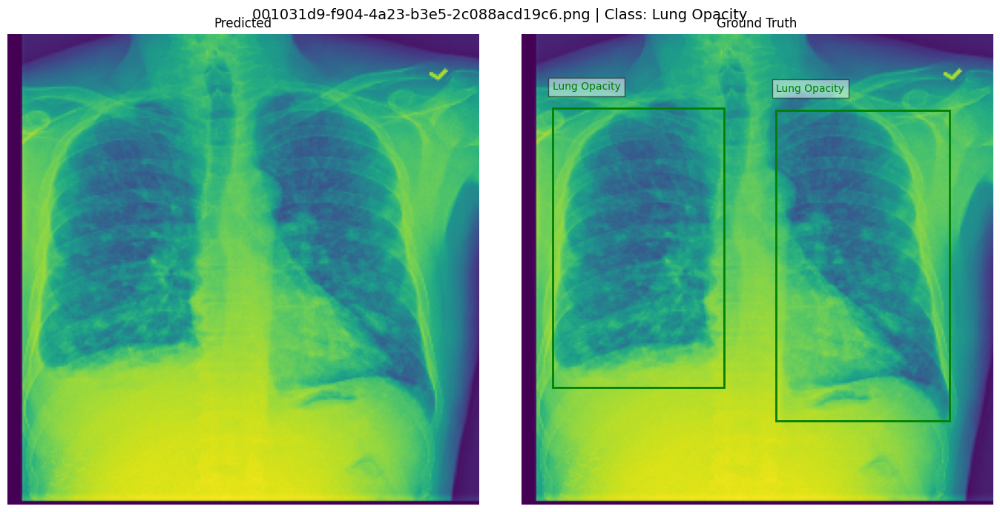


image 1/1 C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo\val\images\0025d2de-bd78-4d36-9f72-e15a5e22ca82.png: 256x256 (no detections), 17.6ms
Speed: 1.5ms preprocess, 17.6ms inference, 0.8ms postprocess per image at shape (1, 3, 256, 256)


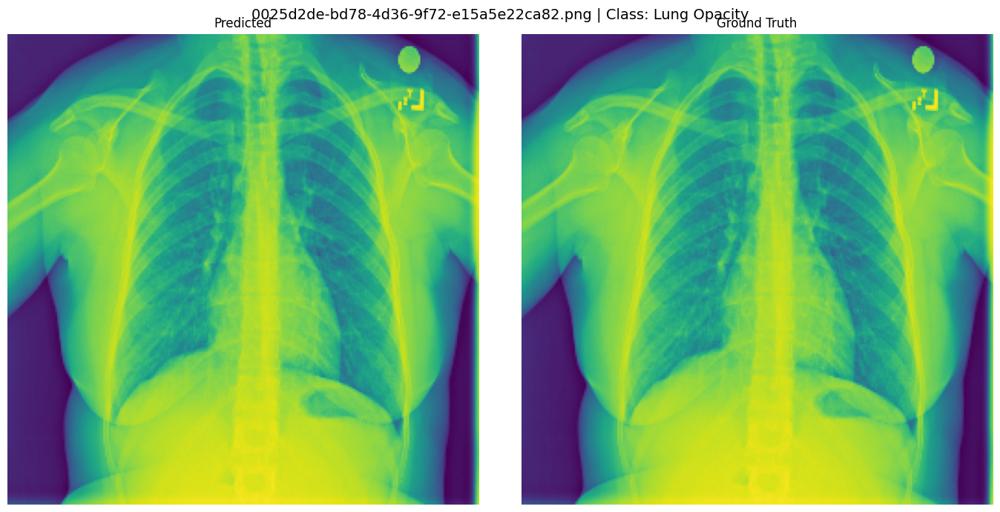


image 1/1 C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo\val\images\00293de0-a530-41dc-9621-0b3def01d06d.png: 256x256 (no detections), 17.6ms
Speed: 1.7ms preprocess, 17.6ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 256)


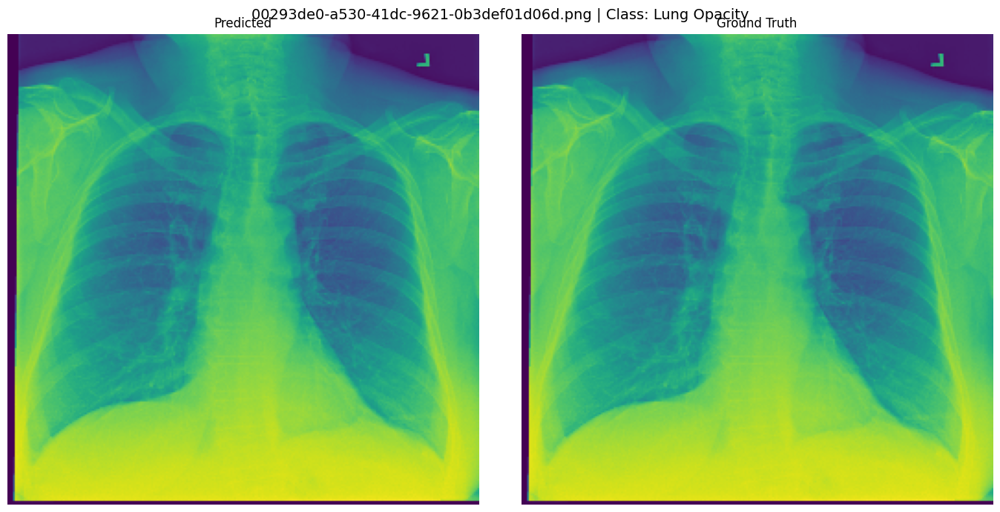


image 1/1 C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo\val\images\002c591d-df62-4e34-8eda-838c664430a9.png: 256x256 (no detections), 17.8ms
Speed: 1.8ms preprocess, 17.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 256)


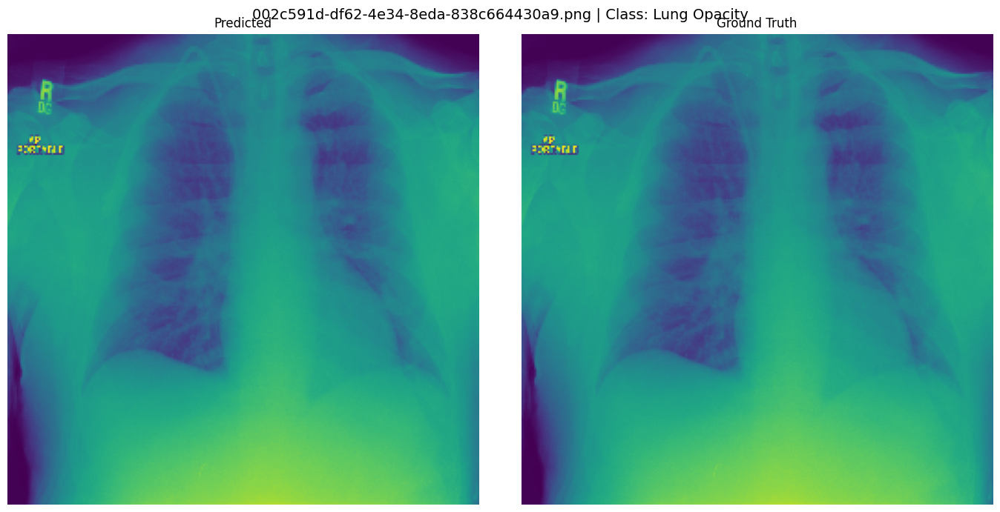


image 1/1 C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo\val\images\002cb550-2e31-42f1-a29d-fbc279977e71.png: 256x256 (no detections), 17.9ms
Speed: 1.6ms preprocess, 17.9ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 256)


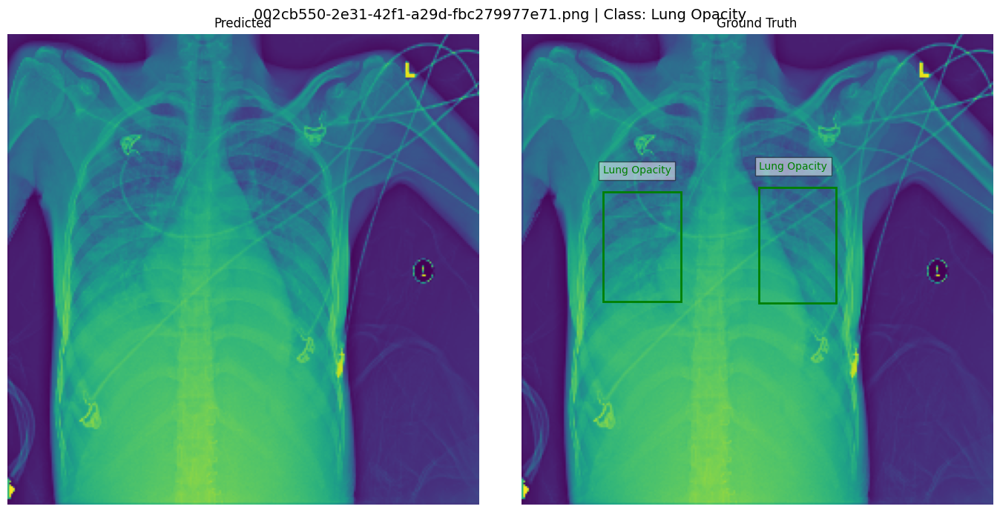


image 1/1 C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo\val\images\0053ee32-1e03-4dc2-a103-f46ad0448787.png: 256x256 (no detections), 17.5ms
Speed: 1.6ms preprocess, 17.5ms inference, 1.1ms postprocess per image at shape (1, 3, 256, 256)


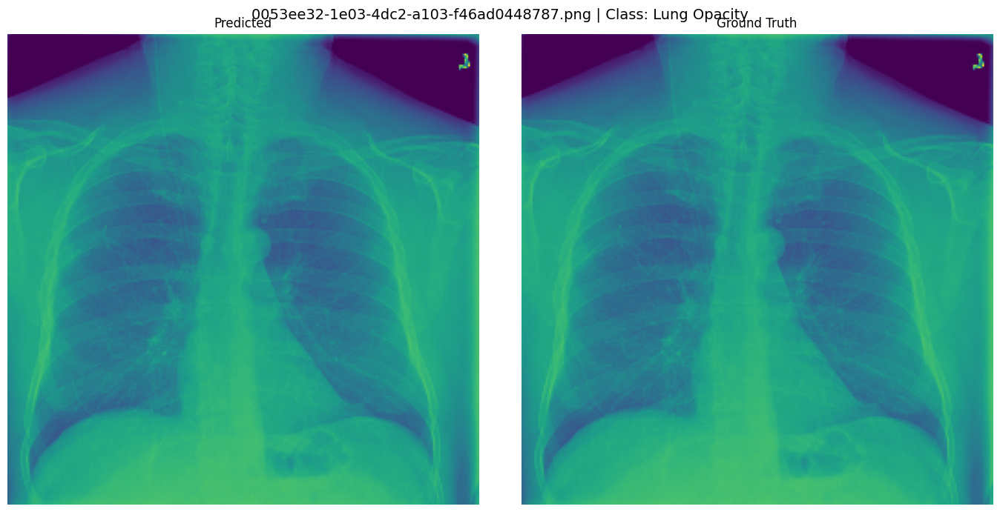


image 1/1 C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo\val\images\006cec2e-6ce2-4549-bffa-eadfcd1e9970.png: 256x256 (no detections), 17.6ms
Speed: 1.8ms preprocess, 17.6ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 256)


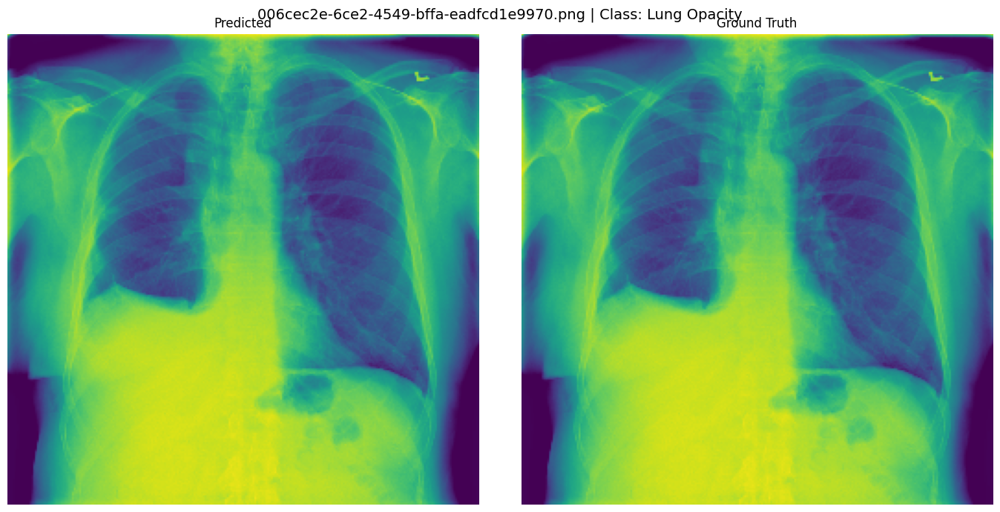


image 1/1 C:\Users\Sunidhi\Downloads\capstone\pneumonia_yolo\val\images\00a05408-8291-4231-886e-13763e103161.png: 256x256 1 Lung Opacity, 17.7ms
Speed: 1.4ms preprocess, 17.7ms inference, 4.8ms postprocess per image at shape (1, 3, 256, 256)


TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

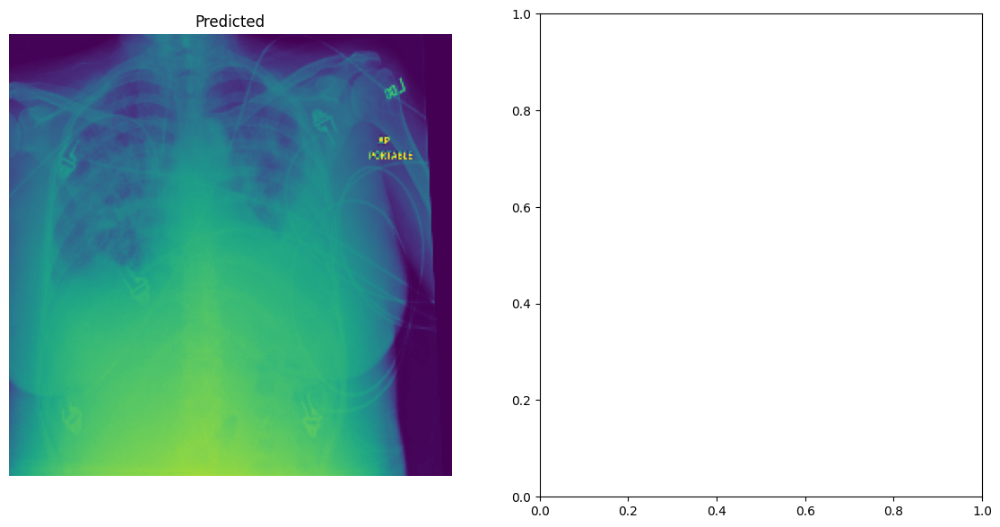

In [97]:
# Visualize Predictions vs Ground Truth

import glob
from PIL import Image
import matplotlib.pyplot as plt

val_img_folder = root_dir + "pneumonia_yolo/val/images"
val_lbl_folder = root_dir + "pneumonia_yolo/val/labels"
test_images = glob.glob(os.path.join(val_img_folder, '*.png'))

model_test = YOLO('runs/detect/train18/weights/best.pt')
class_names = {0: 'Lung Opacity', 1: 'No Lung Opacity / Not Normal', 2: 'Normal'}

for img_path in test_images[:10]:
    base = os.path.basename(img_path).replace('.png', '.txt')
    label_path = os.path.join(val_lbl_folder, base)
    
    results = model_test(img_path, conf=0.25)
    img = Image.open(img_path)

    fig, axs = plt.subplots(1, 2, figsize=(14, 7))
    axs[0].imshow(img)
    axs[0].set_title("Predicted")
    axs[0].axis("off")

    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = box.xyxy[0]
            cls_id = int(box.cls[0])
            axs[0].add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, edgecolor='red', linewidth=2))
            axs[0].text(x1, y1-10, model_test.names[cls_id], color='red', fontsize=10, bbox=dict(facecolor='white', alpha=0.5))

    axs[1].imshow(img)
    axs[1].set_title("Ground Truth")
    axs[1].axis("off")

    if os.path.exists(label_path):
        with open(label_path) as f:
            for line in f:
                cls, x, y, w, h = map(float, line.strip().split())
                img_w, img_h = img.size
                x1 = (x - w/2) * img_w
                y1 = (y - h/2) * img_h
                x2 = (x + w/2) * img_w
                y2 = (y + h/2) * img_h
                axs[1].add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, edgecolor='green', linewidth=2))
                axs[1].text(x1, y1-10, class_names[int(cls)], color='green', fontsize=10, bbox=dict(facecolor='white', alpha=0.5))

    plt.suptitle(f"{os.path.basename(img_path)} | Class: {class_names[int(cls)]}", fontsize=14)
    plt.tight_layout()
    plt.show()


### Hybrid Model [YOLO + RCNN]

**Why Yolo+RCNN?**

**YOLO** - Initial YOLO based detection having quick inference due to its single stage regression based approach.

**Faster-RCNN** - Can refine the detection further leading to better accuracy  

Both of them together can be a effective in classifying and predicting the regions with lung opacity.

In [93]:
class HybridYOLOv8RCNN:
    def __init__(self, yolo_model_path='yolov8s.pt', rcnn_model_name='fasterrcnn_resnet50_fpn', yolo_conf_thresh=0.3):
        self.yolo_model = YOLO(yolo_model_path)
        self.rcnn_model = models.detection.__dict__[rcnn_model_name](pretrained=True)
        self.rcnn_model.eval()
        self.yolo_conf_thresh = yolo_conf_thresh
        self.rcnn_transform = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
        ])

    def preprocess_image(self, numpy_img):
        pil_img = Image.fromarray(numpy_img.astype(np.uint8))
        img_tensor = self.rcnn_transform(pil_img).unsqueeze(0)
        return img, img_tensor

    def get_yolo_proposals(self, numpy_img_path):
        results = self.yolo_model(numpy_img_path)
        detections = results[0].boxes
        proposals = []
        for det in detections:
            if det.prob >= self.yolo_conf_thresh:
                proposals.append(det.boxes.xyxy[0].tolist())
        return proposals

    def refine_with_rcnn(self, img_tensor, proposals):
        if not proposals:
            print("No YOLO proposals to refine.")
            return None
        boxes = torch.tensor(proposals, dtype=torch.float32)
        inputs = [{'boxes': boxes}]
        with torch.no_grad():
            outputs = self.rcnn_model(img_tensor)
        return outputs

    def plot_results(self, img, outputs, threshold=0.5):
        fig, ax = plt.subplots(1)
        ax.imshow(img)
        if outputs is None:
            print("No proposals to refine.")
            return
        
        for box, label, score in zip(outputs[0]['boxes'], outputs[0]['labels'], outputs[0]['scores']):
            if score < threshold:
                continue
            x1, y1, x2, y2 = box
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(x1, y1, f"Class: {label}, Score: {score:.2f}", color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))
        plt.axis('off')
        plt.show()

    def detect_and_show(self, numpy_img_path, rcnn_score_thresh=0.5):
        # dicom = pydicom.dcmread(dicom_image_path, force=True)
        # if not hasattr(dicom.file_meta, 'TransferSyntaxUID'):
        #         dicom.file_meta.TransferSyntaxUID = pydicom.uid.ExplicitVRLittleEndian
        # img = dicom.pixel_array.astype(np.float32)
        # numpy_img_path = root_dir + r"preprocessed_images\0a03a65b-9e45-4e3d-ae6c-b8a37112ab31.npy"
        img = np.load(numpy_img_path)
        # png_image_path = root_dir + "pneumonia_yolo_single_class/train/images/0a03a65b-9e45-4e3d-ae6c-b8a37112ab31.png"
        png_image_path = numpy_img_path + ".png"
        img = (img - img.min()) / (img.max() - img.min()) * 255.0
        img = img.squeeze()
        img = cv2.resize(img, (256,256))
        img, img_tensor = self.preprocess_image(img)
        Image.fromarray(img.astype(np.uint8)).save(png_image_path)
        proposals = self.get_yolo_proposals(png_image_path)
        outputs = self.refine_with_rcnn(img_tensor, proposals)
        self.plot_results(img, outputs, threshold=rcnn_score_thresh)
        os.remove(png_image_path)


image 1/1 C:\Users\Sunidhi\Downloads\capstone\preprocessed_images\b4147465-8b3a-4200-ba9c-a5eae09eafa9.npy.png: 256x256 (no detections), 54.6ms
Speed: 6.9ms preprocess, 54.6ms inference, 20.1ms postprocess per image at shape (1, 3, 256, 256)

image 1/1 C:\Users\Sunidhi\Downloads\capstone\preprocessed_images\001916b8-3d30-4935-a5d1-8eaddb1646cd.npy.png: 256x256 (no detections), 53.5ms
Speed: 2.2ms preprocess, 53.5ms inference, 2.7ms postprocess per image at shape (1, 3, 256, 256)

image 1/1 C:\Users\Sunidhi\Downloads\capstone\preprocessed_images\34297b7d-9e22-4e73-b105-a8db72ad36ee.npy.png: 256x256 (no detections), 53.9ms
Speed: 1.7ms preprocess, 53.9ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)

image 1/1 C:\Users\Sunidhi\Downloads\capstone\preprocessed_images\59aa41cb-ece4-46c3-8ded-a26ed0284271.npy.png: 256x256 (no detections), 53.8ms
Speed: 1.9ms preprocess, 53.8ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 256)

image 1/1 C:\Users\Sunidhi\Dow

KeyboardInterrupt: 

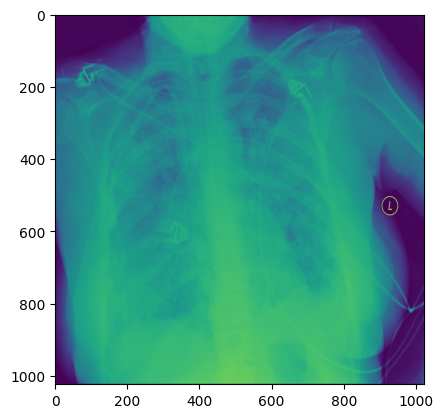

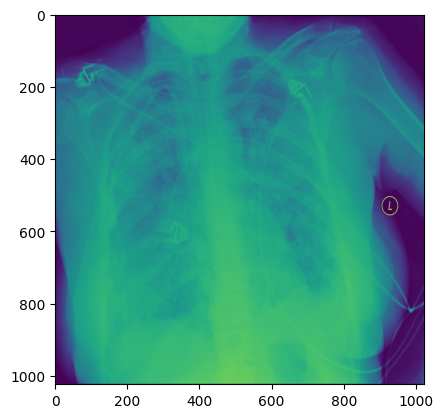

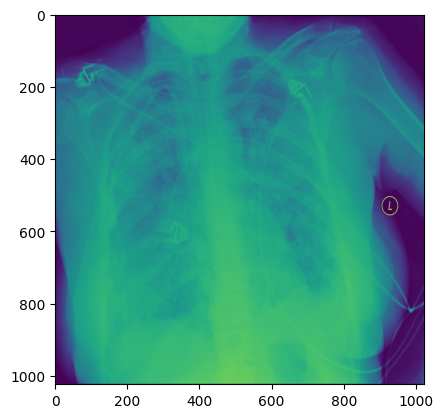

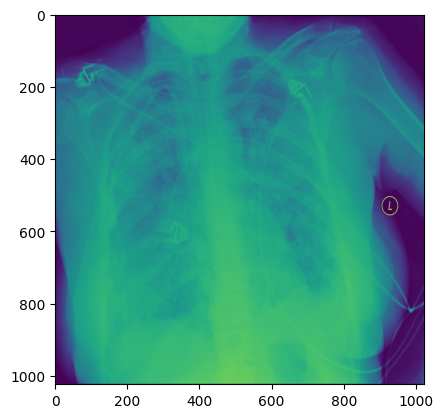

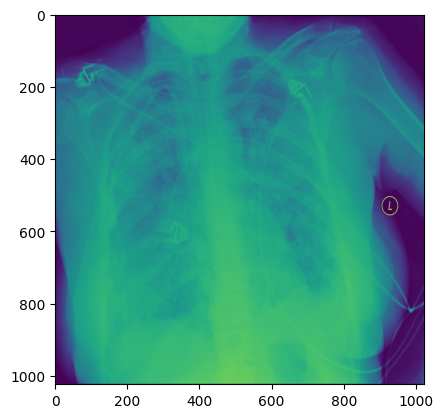

...

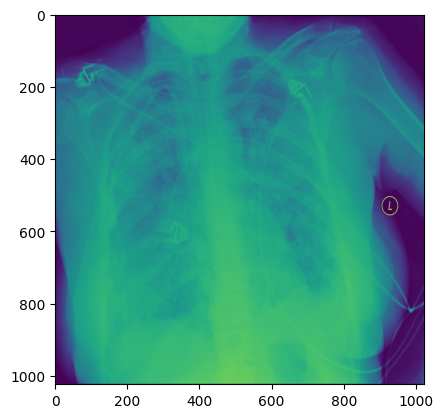

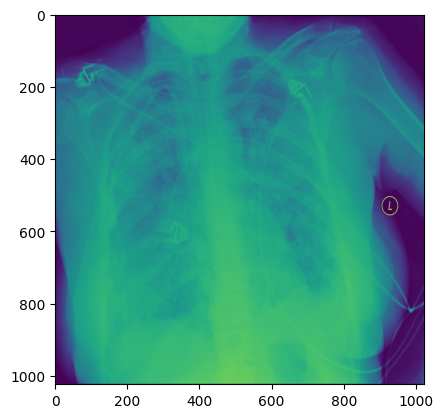

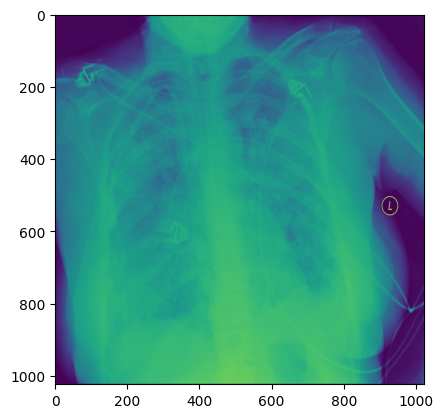

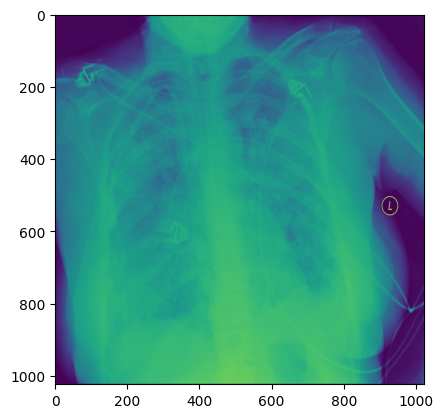

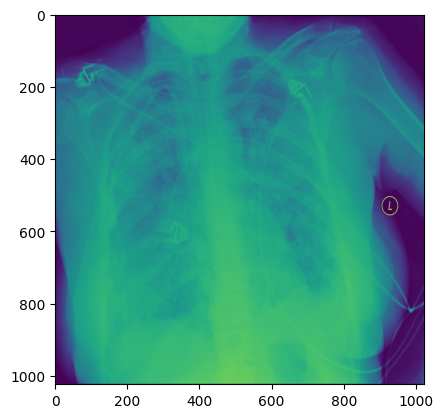

Error in callback <function flush_figures at 0x00000184B99442C0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [ ]:
best_model_path = root_dir + r"runs\detect\train6\weights\best.pt"
detector = HybridYOLOv8RCNN(yolo_model_path=best_model_path, rcnn_model_name='fasterrcnn_resnet50_fpn', yolo_conf_thresh=0.01)
df = val_df[val_df['Target'] == 1]
patient_ids = df['patientId'].unique()
for pid in patient_ids:
    image_path = os.path.join(root_dir, "preprocessed_images", str(pid), ".npy")
    detector.detect_and_show(image_path, rcnn_score_thresh=0.1)

In [105]:
import torch
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.transform import GeneralizedRCNNTransform
from ultralytics import YOLO
from torch import nn

class HybridYOLOFasterRCNN(nn.Module):
    def __init__(self, yolo_weights, num_classes):
        super().__init__()
        # Initialize YOLO for proposal generation
        self.__dict__['yolo'] = YOLO(yolo_weights)
        self.yolo.eval()  # Freeze YOLO weights
        
        # Initialize full Faster R-CNN model
        self.faster_rcnn = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
        
        # Replace box predictor for custom classes
        in_features = self.faster_rcnn.roi_heads.box_predictor.cls_score.in_features
        self.faster_rcnn.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
        
        # Extract core components
        self.backbone = self.faster_rcnn.backbone
        self.transform = self.faster_rcnn.transform
        self.roi_heads = self.faster_rcnn.roi_heads
        
    def forward(self, images, targets=None):
        original_image_sizes = []
        proposals = []
        
        # Generate proposals with YOLO
        for img in images:
            original_image_sizes.append(img.shape[-2:])
            with torch.no_grad():
                results = self.__dict__['yolo'](img[None,...])[0]  # Add batch dimension
                proposals.append(results.boxes.xyxy)
        
        # Transform images and targets
        images, targets = self.transform(images, targets)
        
        # Get features from Faster R-CNN backbone
        features = self.backbone(images.tensors)
        
        # Convert proposals to transformed image space
        proposals = self.transform.postprocess(
            proposals, images.image_sizes, original_image_sizes
        )
        
        # Use Faster R-CNN's ROI heads with our proposals
        detections, detector_losses = self.roi_heads(
            features, proposals, images.image_sizes, targets)
        
        return detections, detector_losses

class HybridTrainer:
    def __init__(self, model, train_loader, val_loader, device='cuda'):
        self.model = model.to(device)
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.device = device
        
        params = [p for p in self.model.parameters() if p.requires_grad]
        self.optimizer = torch.optim.SGD(
            params, lr=0.005, momentum=0.9, weight_decay=0.0005)
        
        self.lr_scheduler = torch.optim.lr_scheduler.StepLR(
            self.optimizer, step_size=3, gamma=0.1)

    def train_epoch(self, epoch):
        self.model.train()
        total_loss = 0.0
        
        for batch_idx, (images, targets) in enumerate(self.train_loader):
            images = list(img.to(self.device) for img in images)
            targets = [{k: v.to(self.device) for k, v in t.items()} 
                      for t in targets]
            
            _, loss_dict = self.model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            
            self.optimizer.zero_grad()
            losses.backward()
            self.optimizer.step()
            
            total_loss += losses.item()
            
            if batch_idx % 10 == 0:
                print(f"Epoch {epoch} | Batch {batch_idx} | Loss: {losses.item():.4f}")
        
        return total_loss / len(self.train_loader)

    def train(self, num_epochs):
        for epoch in range(num_epochs):
            train_loss = self.train_epoch(epoch)
            self.lr_scheduler.step()
            print(f"Epoch {epoch} | Avg Loss: {train_loss:.4f}")
            self.validate()

    def validate(self):
        self.model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, targets in self.val_loader:
                images = list(img.to(self.device) for img in images)
                targets = [{k: v.to(self.device) for k, v in t.items()} 
                          for t in targets]
                
                _, loss_dict = self.model(images, targets)
                val_loss += sum(loss for loss in loss_dict.values()).item()
        
        print(f"Validation Loss: {val_loss/len(self.val_loader):.4f}")

In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import numpy as np

class PneumoniaDetectionDataset(Dataset):
    def __init__(self, image_dir, annotation_dir, transform=None):
        self.image_dir = image_dir
        self.annotation_dir = annotation_dir
        self.transform = transform
        self.image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.png')])
        
        # Verify annotations exist for all images
        self.annotation_files = []
        for img_file in self.image_files:
            ann_file = os.path.join(annotation_dir, img_file.replace('.png', '.txt'))
            if os.path.exists(ann_file):
                self.annotation_files.append(ann_file)
            else:
                raise FileNotFoundError(f"Annotation file missing for {img_file}")

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # Load image
        img_path = os.path.join(self.image_dir, self.image_files[idx])
        img = Image.open(img_path).convert('RGB')  # Force 3 channels for model
        
        # Apply transforms
        if self.transform:
            img = self.transform(img)
        else:
            img = torch.from_numpy(np.array(img)).permute(2,0,1).float() / 255.0

        # Load annotations
        boxes = []
        labels = []
        with open(self.annotation_files[idx]) as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) != 5:
                    continue
                
                # Convert YOLO format to absolute coordinates
                class_id, x_center, y_center, width, height = map(float, parts)
                
                # Convert to absolute coordinates
                img_width, img_height = img.shape[2], img.shape[1]
                x_center *= img_width
                y_center *= img_height
                width *= img_width
                height *= img_height
                
                x_min = x_center - width/2
                y_min = y_center - height/2
                x_max = x_center + width/2
                y_max = y_center + height/2
                
                boxes.append([x_min, y_min, x_max, y_max])
                labels.append(1)  # Assuming single class detection

        # Handle empty boxes
        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            
        labels = torch.as_tensor(labels, dtype=torch.int64)
        
        target = {
            'boxes': boxes,
            'labels': labels
        }
        
        return img, target

def collate_fn(batch):
    return tuple(zip(*batch))

# Data transforms
transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                    std=[0.229, 0.224, 0.225])
])
train_images_dir = os.path.join(root_dir, 'pneumonia_yolo','train', 'images')
train_labels_dir = os.path.join(root_dir, 'pneumonia_yolo','train', 'labels')
val_images_dir = os.path.join(root_dir, 'pneumonia_yolo', 'val', 'images')
val_labels_dir = os.path.join(root_dir, 'pneumonia_yolo', 'val', 'labels')
# Create datasets
train_dataset = PneumoniaDetectionDataset(
    image_dir=train_images_dir,
    annotation_dir=train_labels_dir,
    transform=transform
)

val_dataset = PneumoniaDetectionDataset(
    image_dir=val_images_dir,
    annotation_dir=val_labels_dir,
    transform=transform
)

# Create data loaders
train_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    num_workers=4,
    collate_fn=collate_fn,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=2,
    shuffle=False,
    num_workers=4,
    collate_fn=collate_fn,
    pin_memory=True
)

best_yolo_model = 'runs/detect/train18/weights/best.pt'
# Initialize model
model = HybridYOLOFasterRCNN(
    yolo_weights=best_yolo_model,
    num_classes=2
)

# Train
trainer = HybridTrainer(model, train_loader, val_loader, device='cuda')
trainer.train(num_epochs=10)

### **Observations & Insights**

#### **Basic Model**

**Observations:**

- Performance improved notably, especially in correctly classifying Lung Opacity.
- Confusion between Lung Opacity and No Lung Opacity suggests:
  - Need for clearer, more distinctive feature extraction.
  - Possible visual similarity between some X-ray images.

---

#### **MobileNet Model**

**Observations:**

- High precision on some classes (e.g., "Normal").
- Lower recall and F1-score on important classes (e.g., "Lung Opacity").
- Training loss decreases steadily, but validation loss plateaus or increases.
- Training accuracy much higher than validation accuracy.
- Evidence of overfitting and poor generalization.

---

#### **LesNet Model**

**Observations:**

- Good recall for Normal and No Lung Opacity classes.
- High precision for Lung Opacity, but recall is relatively lower.

---

#### **DeepCNN Model**

**Observations:**

- Some categories strongly outperform others.
- Distribution reveals strengths and areas needing improvement.
- Strong performers can guide focus and benchmarking.
- Weak areas require targeted training or resource allocation.
- Low correlations suggest independence.
- Useful for feature selection, avoiding multicollinearity, identifying key drivers, and risk assessment.

